In [1]:
field = 'NW'
max_zoi = 100

In [2]:
# Parameters
field = "NE"


In [3]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.path import Path

from astropy.io import fits
from scipy.ndimage import gaussian_filter1d, map_coordinates

from scipy import ndimage

from tqdm import tqdm

plt.rcParams.update({
    "font.family": "serif",
    "mathtext.fontset": "cm",
    "axes.linewidth": 1.5,
    "xtick.direction": "in",
    "ytick.direction": "in",
})

plt.rcParams["text.usetex"] = False

plt.rc('text', usetex=True)
plt.rc('font', family='serif', size=20)

#add rc param for ticks are inwards and minor ticks are on
plt.rc('xtick', direction='in', top=True)
plt.rc('ytick', direction='in', right=True)

FIELD = field
# FIELD: which map/cutout field to process; used to build input/output paths and region IDs.

# max_zoi: maximum Zone-of-Influence radius used to select the ZOI FITS map directory (in pc).

make_plots = False
# make_plots: if True, generates and saves per-region diagnostic plots (can be slow for many regions).

# ---------------------------
# Inputs
# ---------------------------

peak_csv = f"CATALOGS/final_peaks_{FIELD}.csv"
# peak_csv: CSV catalog listing region centers (x, y) to seed boundary finding.

halpha_fits = f'peak_files/data_for_visualisation_OIII+Ha_{FIELD}/M33_{FIELD}_HaOIII_amp_nonan.fits'
# halpha_fits: FITS image of the Halpha map used for boundary finding.

zoi_fits = f"ZOI_maps/ZOI_map_{max_zoi}pc/ZoI_map_{FIELD}.fits"
contzoi_fits = f"ZOI_maps/ZOI_map_{max_zoi}pc/ContZoI_map_{FIELD}.fits"
# zoi_fits: labeled ZOI map where each region is a positive integer label.

data, header_info = fits.getdata(halpha_fits, header=True)


# ---------------------------
# Outputs
# ---------------------------

BOUND_DIR = f"Boundary_maps/Boundary_map_{max_zoi}pc"
# BOUND_DIR: directory to write the boundary label FITS and summary tables.

os.makedirs(BOUND_DIR, exist_ok=True)

boundary_fits = f"{BOUND_DIR}/Boundary_map_{FIELD}.fits"
# boundary_fits: output FITS where each pixel contains the final region label (0 outside).

metrics_csv = f"{BOUND_DIR}/Boundary_metrics_{FIELD}.csv"
# metrics_csv: per-region table with background, radii percentiles, and other metrics.

plots_dir = "plots/boundary_plots/"
# plots_dir: directory to save diagnostic PNGs.

os.makedirs(plots_dir, exist_ok=True)

# ---------------------------
# Pixel-to-parsec conversion
# ---------------------------

PIXEL_SCALE_PC = None
# PIXEL_SCALE_PC: physical size of one pixel in parsecs (pc/px). Set this if you know it.

ASSUME_DISTANCE_MPC = 0.84
# ASSUME_DISTANCE_MPC: optional assumed distance to the target (Mpc) if you want to estimate pc/px from WCS.

# ---------------------------
# Per-azimuth (ray) boundary settings
# ---------------------------

N_THETA = 72
# N_THETA: number of angular rays sampled uniformly from 0..2pi per region.

R_BIN = 2.0
# R_BIN: radial sampling step along each ray, in pixels (smaller = finer but slower).

SMOOTH_SIGMA = 1.2
# SMOOTH_SIGMA: Gaussian sigma (in bins) used to smooth the 1D ray profile before edge detection.

EDGE_FRAC = 1 #originally =0.99
# EDGE_FRAC: edge crossing threshold defined as bg + EDGE_FRAC * ray prominence (closer to 1 = closer to peak).

FALLBACK_SIG_K = 1.0 #originally = 10
# FALLBACK_SIG_K: fallback edge crossing threshold bg + k*sigma if prominence-based crossing fails.

RMAX_DEFAULT = max_zoi
# RMAX_DEFAULT: maximum search radius along rays (in pixels); typically tied to your ZOI choice.

# ---------------------------
# Local angular outlier suppression / smoothing
# ---------------------------

ANG_WIN_SECTORS = max(5, (N_THETA // 8) * 2 + 1)
# ANG_WIN_SECTORS: window size (in rays) to compute local median/MAD around each angle (kept odd-ish).

MAD_K_CLIP = 2.2
# MAD_K_CLIP: clip each r(theta) to local median ± k·MAD to suppress angular outliers.

SLOPE_ALPHA = 0.3
# SLOPE_ALPHA: slope cap strength; maximum step between neighboring rays is alpha * median(r).

SLOPE_MIN_PX = 4.0
# SLOPE_MIN_PX: minimum allowed slope cap in pixels (prevents over-tight smoothing on tiny regions).

SPIKE_K_NEIGH = 2.0
# SPIKE_K_NEIGH: neighbor-spike replacement threshold; replace r[i] if it exceeds neighbor mean + k·MAD.

SG_WINDOW = 7
# SG_WINDOW: Savitzky-Golay smoothing window (odd). Set to 0/None to disable.

SG_POLY = 2
# SG_POLY: polynomial order for Savitzky-Golay smoothing.

GLOBAL_P95_CAP = True
# GLOBAL_P95_CAP: if True, caps radii to the within-region 95th percentile after ZOI clamping to prevent extremes.

In [4]:
"""
Loads the Halpha map, the ZOI label map, and the region center catalog; also prepares an estimate of pc/px if requested.
"""
from astropy.wcs import WCS

def load_first_2d_image_from_fits(path):
    """Load the first HDU containing a 2D image; returns (data, header)."""
    with fits.open(path) as hdul:
        for h in hdul:
            if getattr(h, "data", None) is not None and getattr(h.data, "ndim", 0) == 2:
                data = h.data.astype(float)
                hdr = h.header
                return data, hdr
    raise RuntimeError(f"No 2D image found in: {path}")

def estimate_pc_per_pixel_from_wcs(header, distance_mpc):
    """
    Estimate pc/px from WCS angular scale and an assumed distance (Mpc).
    This is optional and can be wrong if headers are missing/odd; prefer setting PIXEL_SCALE_PC explicitly.
    """
    try:
        w = WCS(header)
        # proj_plane_pixel_scales gives degrees/pixel in each axis (requires astropy >= 3)
        from astropy.wcs.utils import proj_plane_pixel_scales
        scales_deg = proj_plane_pixel_scales(w)  # deg/px
        # Use mean angular scale
        deg_per_px = float(np.nanmean(scales_deg))
        if not np.isfinite(deg_per_px) or deg_per_px <= 0:
            return None

        # Convert angle to radians
        rad_per_px = deg_per_px * (np.pi / 180.0)

        # Small-angle: physical = D * theta
        # D in pc:
        d_pc = float(distance_mpc) * 1e6
        pc_per_px = d_pc * rad_per_px
        return pc_per_px
    except Exception:
        return None

# --- Load Halpa map ---
halpha, halpha_hdr = load_first_2d_image_from_fits(halpha_fits)
halpha = np.where(np.isfinite(halpha), halpha, np.nan)

# --- Load ZOI label map ---
zoi_label, _zoi_hdr = load_first_2d_image_from_fits(zoi_fits)
contzoi_label, _ = load_first_2d_image_from_fits(contzoi_fits)

if zoi_label.shape != halpha.shape:
    print(f"[warn] ZOI shape {zoi_label.shape} != Halpha shape {halpha.shape}. Proceeding assuming same pixel grid.")

# --- Load catalog ---
combined = pd.read_csv(peak_csv)

# Ensure required columns exist
required = {"x", "y"}
if not required.issubset(combined.columns):
    raise ValueError(f"{peak_csv} must contain columns: {required}")

combined = combined.copy()
combined["kind"] = combined.get("kind", "peak")
combined["field"] = FIELD

combined["x"] = pd.to_numeric(combined["x"], errors="coerce")
combined["y"] = pd.to_numeric(combined["y"], errors="coerce")
combined = combined.dropna(subset=["x", "y"]).reset_index(drop=True)

# Create a stable region_id even if CSV order changes
combined["region_id"] = [f"{FIELD}_{i+1:04d}" for i in range(len(combined))]

# Determine the ZOI integer label at each center (if any)
def label_at_xy(label_map, x, y):
    yi, xi = int(round(y)), int(round(x))
    if 0 <= yi < label_map.shape[0] and 0 <= xi < label_map.shape[1]:
        v = label_map[yi, xi]
        if np.isfinite(v) and v > 0:
            return int(round(v))
    return 0

combined["zoi_center_label"] = [label_at_xy(zoi_label, x, y) for x, y in zip(combined["x"], combined["y"])]

# Establish pc/px scale
if PIXEL_SCALE_PC is None:
    PIXEL_SCALE_PC = estimate_pc_per_pixel_from_wcs(halpha_hdr, ASSUME_DISTANCE_MPC)

if PIXEL_SCALE_PC is None:
    print("[info] PIXEL_SCALE_PC is not set and could not be estimated from WCS; pc values will be NaN.")
else:
    print(f"[info] Using PIXEL_SCALE_PC = {PIXEL_SCALE_PC:.4g} pc/px")

[info] Using PIXEL_SCALE_PC = 1.318 pc/px


In [5]:
"""
Helper functions: background estimation, ray sampling & edge finding, polygon rasterization,
and robust angular cleanup (MAD clipping, slope cap, spike replacement, optional SG smoothing).
"""
from astropy.stats import mad_std

def robust_bg_sigma_local(img, cx, cy, rmax, frac_in=0.7, frac_out=0.95):
    """
    Estimate local background and noise using an annulus between frac_in*rmax and frac_out*rmax.
    Returns (bg_median, sigma_MAD).
    """
    yy, xx = np.indices(img.shape)
    rr = np.hypot(xx - cx, yy - cy)

    rin, rout = frac_in * rmax, frac_out * rmax
    mask = (rr >= rin) & (rr < rout) & np.isfinite(img)
    vals = img[mask]

    bg = np.nanmedian(vals) if vals.size else 0.0
    sig = mad_std(vals - bg, ignore_nan=True) if vals.size else 0.0
    return float(bg), float(sig)

def sample_ray_profile(img, mask_in, cx, cy, theta, rmax, dr=1.0, smooth_sigma=1.2):
    """
    Sample an intensity profile along a ray at angle theta out to rmax.
    If mask_in is provided, clamp the ray to the last in-mask sample (ZOI rim),
    and return only the within-ZOI profile.
    """
    r = np.arange(0, rmax + dr, dr, dtype=float)
    ys = cy + r * np.sin(theta)
    xs = cx + r * np.cos(theta)

    prof = map_coordinates(img, [ys, xs], order=1, mode="nearest")
    prof = np.where(np.isfinite(prof), prof, np.nan)

    prof_s = gaussian_filter1d(
        prof, sigma=max(1e-6, smooth_sigma), mode="nearest", truncate=3.0
    )

    inmask = None
    if mask_in is not None:
        lab = map_coordinates(mask_in, [ys, xs], order=0, mode="nearest")
        inmask = np.isfinite(lab) & (lab > 0.5)

        # ---- ZOI CLAMP: keep only samples within the ZOI ----
        if inmask.any():
            last_idx = np.where(inmask)[0].max()
            r = r[: last_idx + 1]
            prof = prof[: last_idx + 1]
            prof_s = prof_s[: last_idx + 1]
            inmask = inmask[: last_idx + 1]
        else:
            # No ZOI hit on this ray; return empty-ish profile so edge finder can flag it
            r = r[:1]
            prof = prof[:1] * np.nan
            prof_s = prof_s[:1] * np.nan
            inmask = inmask[:1]

    return r, prof, prof_s, inmask

def find_edge_on_ray(r, prof_s, bg, sigma, inmask=None, edge_frac=0.5, fallback_sig_k=1.0):
    """
    Find an edge radius on a ray using:
      1) crossing at bg + edge_frac * prominence
      2) fallback crossing at bg + k*sigma
      3) first local minimum
      4) clamp to last in-mask radius (ZOI rim)
    Returns (radius, flag_string).
    """
    if not np.isfinite(prof_s).any():
        return np.nan, "RAY_EMPTY"
    
    if inmask is not None and inmask.any():
        last_idx = np.where(inmask)[0].max()
        r = r[: last_idx + 1]
        prof_s = prof_s[: last_idx + 1]
        inmask = inmask[: last_idx + 1]

    i_peak = int(np.nanargmax(prof_s))
    height = prof_s[i_peak]
    prom = height - bg
    lvl  = bg + edge_frac * max(prom, 0.0)
    start = min(len(r) - 2, i_peak + 1)

    # 1) prominence-based crossing
    for j in range(start, len(r) - 1):
        y0, y1 = prof_s[j], prof_s[j + 1]
        if np.isfinite([y0, y1]).all() and (y0 >= lvl) and (y1 <= lvl):
            t = 0.0 if (y1 == y0) else (lvl - y0) / (y1 - y0)
            return float(r[j] + t * (r[j + 1] - r[j])), "RAY_CROSS_FRAC_PROM"

    # 2) fallback crossing
    lvl2 = bg + fallback_sig_k * sigma
    for j in range(start, len(r) - 1):
        y0, y1 = prof_s[j], prof_s[j + 1]
        if np.isfinite([y0, y1]).all() and (y0 >= lvl2) and (y1 <= lvl2):
            t = 0.0 if (y1 == y0) else (lvl2 - y0) / (y1 - y0)
            return float(r[j] + t * (r[j + 1] - r[j])), "RAY_CROSS_BG_KSIG"

    # 3) first local minimum
    dy = np.diff(prof_s)
    for j in range(start, len(r) - 2):
        if np.isfinite([dy[j], dy[j + 1]]).all() and (dy[j] < 0) and (dy[j + 1] >= 0):
            return float(r[j + 1]), "RAY_LOCAL_MIN"

    # 4) clamp to ZOI rim
    if inmask is not None and inmask.any():
        last_idx = np.where(inmask)[0].max()
        return float(r[last_idx]), "RAY_CLAMP_TO_ZOI"

    return np.nan, "RAY_FAIL"

def polygon_from_polar(cx, cy, thetas, radii):
    """Convert polar boundary samples (thetas, radii) into polygon vertices (x,y)."""
    xs = cx + radii * np.cos(thetas)
    ys = cy + radii * np.sin(thetas)
    return np.vstack([xs, ys]).T

def rasterize_polygon_to_mask(shape, poly_xy):
    """Rasterize a polygon into a boolean mask with the same shape as the target image."""
    if len(poly_xy) < 3:
        return np.zeros(shape, dtype=bool)
    path = Path(poly_xy, closed=True)
    ys, xs = np.indices(shape)
    pts = np.vstack([xs.ravel(), ys.ravel()]).T
    inside = path.contains_points(pts, radius=0.0).reshape(shape)
    return inside

# --- Robust circular statistics and smoothing utilities ---

def circular_local_stats(vals, win):
    """Return local median and MAD for a periodic 1D array."""
    vals = np.asarray(vals, float)
    n = len(vals)
    pad = win // 2
    x = np.concatenate([vals[-pad:], vals, vals[:pad]])
    meds = np.empty(n)
    mads = np.empty(n)
    for i in range(n):
        w = x[i : i + win]
        m = np.nanmedian(w)
        meds[i] = m
        mads[i] = 1.4826 * np.nanmedian(np.abs(w - m))
    return meds, mads

def slope_cap(vals, L):
    """Enforce |r[i]-r[i-1]| <= L on a circular array via forward/backward passes."""
    r = np.array(vals, float).copy()
    n = len(r)

    # forward (upward spikes)
    for i in range(1, n):
        if r[i] > r[i - 1] + L:
            r[i] = r[i - 1] + L
    if r[0] > r[-1] + L:
        r[0] = r[-1] + L

    # backward (upward spikes)
    for i in range(n - 2, -1, -1):
        if r[i] > r[i + 1] + L:
            r[i] = r[i + 1] + L

    # forward (downward spikes)
    for i in range(1, n):
        if r[i] < r[i - 1] - L:
            r[i] = r[i - 1] - L
    if r[0] < r[-1] - L:
        r[0] = r[-1] - L

    # backward (downward spikes)
    for i in range(n - 2, -1, -1):
        if r[i] < r[i + 1] - L:
            r[i] = r[i + 1] - L

    return r

def neighbor_spike_replace(vals, local_mad, k=2.0):
    """Replace r[i] by neighbor-mean if r[i] > mean(neigh) + k*localMAD[i]."""
    r = np.array(vals, float).copy()
    n = len(r)
    for i in range(n):
        im = (i - 1) % n
        ip = (i + 1) % n
        neigh_mean = 0.5 * (r[im] + r[ip])
        if r[i] > neigh_mean + k * local_mad[i]:
            r[i] = neigh_mean
    return r

def tiny_sg(vals, win=7, poly=2):
    """Small Savitzky-Golay smoothing on a circular array (wrap mode); falls back to moving average."""
    if win is None or win < 3 or win % 2 == 0:
        return np.array(vals, float)

    try:
        from scipy.signal import savgol_filter
        return savgol_filter(np.array(vals, float), window_length=win, polyorder=poly, mode="wrap")
    except Exception:
        a = np.array(vals, float)
        pad = win // 2
        x = np.concatenate([a[-pad:], a, a[:pad]])
        kern = np.ones(win, float) / win
        sm = np.convolve(x, kern, mode="same")[pad:-pad]
        return sm

In [6]:
"""
Main boundary computation: loops over regions, estimates background, traces ray edges, cleans r(theta),
builds polygon masks, writes the boundary label map array, and stores per-region metrics including bg and ray percentiles.
"""

print(f"[CHECKPOINT] getting region domains, be patient....:)", flush=True)

boundary_label = np.zeros_like(zoi_label, dtype=np.float32)

metrics_rows = []
region_diagnostics = {}  # optional storage for plotting

for _, row in tqdm(combined.iterrows(), total=len(combined)):
    kind = str(row.get("kind", "peak"))
    cx = float(row["x"])
    cy = float(row["y"])
    rid = str(row["region_id"])
    region_label = int(row.get("zoi_center_label", 0))

    # Local cutout for efficiency
    rmax = float(RMAX_DEFAULT)
    x0 = max(0, int(np.floor(cx - rmax)))
    x1 = min(halpha.shape[1], int(np.ceil(cx + rmax + 1)))
    y0 = max(0, int(np.floor(cy - rmax)))
    y1 = min(halpha.shape[0], int(np.ceil(cy + rmax + 1)))

    sub = halpha[y0:y1, x0:x1]
    cx_l = cx - x0
    cy_l = cy - y0

    # Background + noise in an annulus around the source (store this for your table)
    bg, sigma = robust_bg_sigma_local(sub, cx_l, cy_l, rmax=rmax)

    # ZOI mask for this region (only if label exists)
    zsub = None
    if region_label > 0:
        zsub = (zoi_label[y0:y1, x0:x1] == region_label).astype(float)

    # ---- Handle rings (if you ever use them) ----
    # Your current workflow appears peak-based; keeping ring hook but making it safe.
    if kind == "ring" and np.isfinite(row.get("ring_radius_px", np.nan)):
        r_final = np.array([float(row["ring_radius_px"])] * N_THETA, dtype=float)
        thetas = np.linspace(0, 2 * np.pi, N_THETA, endpoint=False)
        edge_method = "RING_GIVEN"
        boundary_mask = np.zeros_like(zoi_label, dtype=bool)  # (placeholder) define if you need rasterization
    else:
        # ---- Peaks: per-angle ray profiles, edge finding, then robust angular cleanup ----
        thetas = np.linspace(0, 2 * np.pi, N_THETA, endpoint=False)

        r_edges_raw = []
        r_zoi_rim = []
        r_profiles_for_plot = []

        for th in thetas:
            r, _prof, prof_s, inmask = sample_ray_profile(
                sub, zsub, cx_l, cy_l, th, rmax, dr=R_BIN, smooth_sigma=SMOOTH_SIGMA
            )
            rr, _flag = find_edge_on_ray(
                r, prof_s, bg, sigma, inmask=inmask, edge_frac=EDGE_FRAC, fallback_sig_k=FALLBACK_SIG_K
            )

            rr = float(np.clip(rr, 0, rmax)) if np.isfinite(rr) else np.nan
            r_edges_raw.append(rr)

            if inmask is not None and inmask.any():
                r_zoi_rim.append(float(r[np.where(inmask)[0].max()]))
            else:
                r_zoi_rim.append(np.inf)

            # store smoothed profiles for diagnostics
            r_profiles_for_plot.append((r, prof_s))

        r_edges_raw = np.array(r_edges_raw, float)
        r_zoi_rim = np.array(r_zoi_rim, float)

        # Diagnostics bookkeeping for plotting (store cutout origin too; avoids recomputing later)
        region_diagnostics[rid] = {
            "sub": sub,
            "cx_l": cx_l,
            "cy_l": cy_l,
            "x0": x0,
            "y0": y0,
            "thetas": thetas,
            "r_profiles": r_profiles_for_plot,
            "r_edges_raw": r_edges_raw.copy(),
            "bg": bg,
            "sigma": sigma,
            "region_label": region_label,
        }

        # 1) Local MAD clipping in angle-space
        med, mad = circular_local_stats(r_edges_raw, win=ANG_WIN_SECTORS)
        mad_fallback = np.nanmedian(mad[np.isfinite(mad) & (mad > 0)])
        if not np.isfinite(mad_fallback) or mad_fallback <= 0:
            mad_fallback = 1.0
        mad = np.where(np.isfinite(mad) & (mad > 0), mad, mad_fallback)

        r_clip = np.minimum(np.maximum(r_edges_raw, med - MAD_K_CLIP * mad), med + MAD_K_CLIP * mad)

        # 2) Slope cap
        med_r = float(np.nanmedian(r_clip[np.isfinite(r_clip)])) if np.isfinite(r_clip).any() else SLOPE_MIN_PX
        L = max(SLOPE_MIN_PX, SLOPE_ALPHA * med_r)
        r_slope = slope_cap(r_clip, L=L)

        # 3) Neighbor replacement
        r_fix = neighbor_spike_replace(r_slope, local_mad=mad, k=SPIKE_K_NEIGH)

        # 4) Tiny SG polish (optional)
        r_sg = tiny_sg(r_fix, win=SG_WINDOW, poly=SG_POLY) if (SG_WINDOW and SG_WINDOW >= 3) else r_fix

        # 5) Clamp to ZOI rim
        r_final = np.minimum(r_sg, r_zoi_rim)

        # 6) Optional within-region p95 cap
        if GLOBAL_P95_CAP and np.isfinite(r_final).any():
            cap = np.nanpercentile(r_final[np.isfinite(r_final)], 95.0)
            r_final = np.minimum(r_final, cap)

        # Polygon → global mask
        poly_local = polygon_from_polar(cx_l, cy_l, thetas, r_final)
        poly_global = poly_local.copy()
        poly_global[:, 0] += x0
        poly_global[:, 1] += y0

        boundary_mask = rasterize_polygon_to_mask(halpha.shape, poly_global)

        # Strict containment in ZOI label if label exists
        if region_label > 0:
            boundary_mask &= (zoi_label == region_label)

        # Paint into label map
        if region_label > 0:
            boundary_label[boundary_mask] = region_label

        edge_method = "ANG_MAD+SLOPE+NEIGH+SG+CLAMP"

    # ---- Metrics ----
    # background subtraction value: bg
    # radius values requested: percentiles of ray lengths (r_final)
    if "r_final" in locals() and np.isfinite(r_final).any():
        r16_px, r50_px, r84_px = np.nanpercentile(r_final[np.isfinite(r_final)], [16, 50, 84])
    else:
        r16_px = r50_px = r84_px = np.nan

    # Convert to pc if scale is known
    if PIXEL_SCALE_PC is not None and np.isfinite(PIXEL_SCALE_PC):
        r16_pc = r16_px * PIXEL_SCALE_PC if np.isfinite(r16_px) else np.nan
        r50_pc = r50_px * PIXEL_SCALE_PC if np.isfinite(r50_px) else np.nan
        r84_pc = r84_px * PIXEL_SCALE_PC if np.isfinite(r84_px) else np.nan
    else:
        r16_pc = r50_pc = r84_pc = np.nan

    # Area-based equivalent radius from the mask (only meaningful for peak workflow)
    area_px = float(np.count_nonzero(boundary_mask)) if "boundary_mask" in locals() else 0.0
    r_areaeq_px = float(np.sqrt(area_px / np.pi)) if area_px > 0 else np.nan
    r_areaeq_pc = r_areaeq_px * PIXEL_SCALE_PC if (np.isfinite(r_areaeq_px) and PIXEL_SCALE_PC is not None) else np.nan

    metrics_rows.append(
        {
            "region_id": rid,
            "field": FIELD,
            "kind": kind,
            "center_x_px": cx,
            "center_y_px": cy,
            "zoi_center_label": region_label,
            "bg_local": bg,
            "sigma_local": sigma,
            "radius_p16_px": float(r16_px),
            "radius_p50_px": float(r50_px),
            "radius_p84_px": float(r84_px),
            "radius_p16_pc": float(r16_pc),
            "radius_p50_pc": float(r50_pc),
            "radius_p84_pc": float(r84_pc),
            "radius_areaeq_px": float(r_areaeq_px),
            "radius_areaeq_pc": float(r_areaeq_pc) if np.isfinite(r_areaeq_pc) else np.nan,
            "boundary_method": edge_method,
        }
    )

print("[done] Boundaries computed into boundary_label array; metrics recorded.")

[CHECKPOINT] getting region domains, be patient....:)


  0%|                                                                                                                                         | 0/797 [00:00<?, ?it/s]

  0%|▏                                                                                                                                | 1/797 [00:00<06:24,  2.07it/s]

  0%|▎                                                                                                                                | 2/797 [00:00<04:24,  3.01it/s]

  0%|▍                                                                                                                                | 3/797 [00:00<03:46,  3.51it/s]

  1%|▋                                                                                                                                | 4/797 [00:01<03:28,  3.80it/s]

  1%|▊                                                                                                                                | 5/797 [00:01<03:19,  3.97it/s]

  1%|▉                                                                                                                                | 6/797 [00:01<03:12,  4.10it/s]

  1%|█▏                                                                                                                               | 7/797 [00:01<03:09,  4.17it/s]

  1%|█▎                                                                                                                               | 8/797 [00:02<03:06,  4.23it/s]

  1%|█▍                                                                                                                               | 9/797 [00:02<03:04,  4.27it/s]

  1%|█▌                                                                                                                              | 10/797 [00:02<03:02,  4.31it/s]

  1%|█▊                                                                                                                              | 11/797 [00:02<03:01,  4.32it/s]

  2%|█▉                                                                                                                              | 12/797 [00:03<03:00,  4.35it/s]

  2%|██                                                                                                                              | 13/797 [00:03<02:59,  4.38it/s]

  2%|██▏                                                                                                                             | 14/797 [00:03<02:58,  4.38it/s]

  2%|██▍                                                                                                                             | 15/797 [00:03<02:58,  4.37it/s]

  2%|██▌                                                                                                                             | 16/797 [00:03<02:58,  4.37it/s]

  2%|██▋                                                                                                                             | 17/797 [00:04<02:58,  4.37it/s]

  2%|██▉                                                                                                                             | 18/797 [00:04<02:57,  4.38it/s]

  2%|███                                                                                                                             | 19/797 [00:04<02:57,  4.39it/s]

  3%|███▏                                                                                                                            | 20/797 [00:04<02:57,  4.38it/s]

  3%|███▎                                                                                                                            | 21/797 [00:05<02:58,  4.36it/s]

  3%|███▌                                                                                                                            | 22/797 [00:05<02:57,  4.36it/s]

  3%|███▋                                                                                                                            | 23/797 [00:05<02:57,  4.36it/s]

  3%|███▊                                                                                                                            | 24/797 [00:05<02:59,  4.31it/s]

  3%|████                                                                                                                            | 25/797 [00:05<02:58,  4.31it/s]

  3%|████▏                                                                                                                           | 26/797 [00:06<02:58,  4.32it/s]

  3%|████▎                                                                                                                           | 27/797 [00:06<02:57,  4.33it/s]

  4%|████▍                                                                                                                           | 28/797 [00:06<02:58,  4.32it/s]

  4%|████▋                                                                                                                           | 29/797 [00:06<02:57,  4.33it/s]

  4%|████▊                                                                                                                           | 30/797 [00:07<02:59,  4.27it/s]

  4%|████▉                                                                                                                           | 31/797 [00:07<02:58,  4.30it/s]

  4%|█████▏                                                                                                                          | 32/797 [00:07<02:59,  4.27it/s]

  4%|█████▎                                                                                                                          | 33/797 [00:07<02:57,  4.31it/s]

  4%|█████▍                                                                                                                          | 34/797 [00:08<02:56,  4.32it/s]

  4%|█████▌                                                                                                                          | 35/797 [00:08<02:55,  4.34it/s]

  5%|█████▊                                                                                                                          | 36/797 [00:08<02:55,  4.33it/s]

  5%|█████▉                                                                                                                          | 37/797 [00:08<02:54,  4.35it/s]

  5%|██████                                                                                                                          | 38/797 [00:08<02:53,  4.37it/s]

  5%|██████▎                                                                                                                         | 39/797 [00:09<02:53,  4.38it/s]

  5%|██████▍                                                                                                                         | 40/797 [00:09<02:52,  4.39it/s]

  5%|██████▌                                                                                                                         | 41/797 [00:09<02:51,  4.40it/s]

  5%|██████▋                                                                                                                         | 42/797 [00:09<02:51,  4.40it/s]

  5%|██████▉                                                                                                                         | 43/797 [00:10<02:51,  4.39it/s]

  6%|███████                                                                                                                         | 44/797 [00:10<02:51,  4.38it/s]

  6%|███████▏                                                                                                                        | 45/797 [00:10<02:52,  4.37it/s]

  6%|███████▍                                                                                                                        | 46/797 [00:10<02:51,  4.37it/s]

  6%|███████▌                                                                                                                        | 47/797 [00:11<02:52,  4.35it/s]

  6%|███████▋                                                                                                                        | 48/797 [00:11<02:51,  4.37it/s]

  6%|███████▊                                                                                                                        | 49/797 [00:11<02:50,  4.38it/s]

  6%|████████                                                                                                                        | 50/797 [00:11<02:52,  4.32it/s]

  6%|████████▏                                                                                                                       | 51/797 [00:11<02:53,  4.30it/s]

  7%|████████▎                                                                                                                       | 52/797 [00:12<02:52,  4.31it/s]

  7%|████████▌                                                                                                                       | 53/797 [00:12<02:51,  4.33it/s]

  7%|████████▋                                                                                                                       | 54/797 [00:12<02:51,  4.34it/s]

  7%|████████▊                                                                                                                       | 55/797 [00:12<03:00,  4.11it/s]

  7%|████████▉                                                                                                                       | 56/797 [00:13<02:58,  4.15it/s]

  7%|█████████▏                                                                                                                      | 57/797 [00:13<02:56,  4.20it/s]

  7%|█████████▎                                                                                                                      | 58/797 [00:13<02:55,  4.21it/s]

  7%|█████████▍                                                                                                                      | 59/797 [00:13<02:54,  4.24it/s]

  8%|█████████▋                                                                                                                      | 60/797 [00:14<02:52,  4.27it/s]

  8%|█████████▊                                                                                                                      | 61/797 [00:14<02:51,  4.30it/s]

  8%|█████████▉                                                                                                                      | 62/797 [00:14<02:50,  4.31it/s]

  8%|██████████                                                                                                                      | 63/797 [00:14<02:49,  4.33it/s]

  8%|██████████▎                                                                                                                     | 64/797 [00:15<02:49,  4.34it/s]

  8%|██████████▍                                                                                                                     | 65/797 [00:15<02:49,  4.32it/s]

  8%|██████████▌                                                                                                                     | 66/797 [00:15<02:48,  4.33it/s]

  8%|██████████▊                                                                                                                     | 67/797 [00:15<02:48,  4.32it/s]

  9%|██████████▉                                                                                                                     | 68/797 [00:15<02:48,  4.34it/s]

  9%|███████████                                                                                                                     | 69/797 [00:16<02:47,  4.34it/s]

  9%|███████████▏                                                                                                                    | 70/797 [00:16<02:46,  4.36it/s]

  9%|███████████▍                                                                                                                    | 71/797 [00:16<02:47,  4.35it/s]

  9%|███████████▌                                                                                                                    | 72/797 [00:16<02:41,  4.50it/s]

  9%|███████████▋                                                                                                                    | 73/797 [00:17<02:42,  4.45it/s]

  9%|███████████▉                                                                                                                    | 74/797 [00:17<02:43,  4.43it/s]

  9%|████████████                                                                                                                    | 75/797 [00:17<02:43,  4.41it/s]

 10%|████████████▏                                                                                                                   | 76/797 [00:17<02:43,  4.40it/s]

 10%|████████████▎                                                                                                                   | 77/797 [00:17<02:43,  4.40it/s]

 10%|████████████▌                                                                                                                   | 78/797 [00:18<02:45,  4.33it/s]

 10%|████████████▋                                                                                                                   | 79/797 [00:18<02:46,  4.31it/s]

 10%|████████████▊                                                                                                                   | 80/797 [00:18<02:45,  4.32it/s]

 10%|█████████████                                                                                                                   | 81/797 [00:18<02:44,  4.34it/s]

 10%|█████████████▏                                                                                                                  | 82/797 [00:19<02:46,  4.28it/s]

 10%|█████████████▎                                                                                                                  | 83/797 [00:19<02:47,  4.27it/s]

 11%|█████████████▍                                                                                                                  | 84/797 [00:19<02:45,  4.31it/s]

 11%|█████████████▋                                                                                                                  | 85/797 [00:19<02:44,  4.33it/s]

 11%|█████████████▊                                                                                                                  | 86/797 [00:20<02:43,  4.35it/s]

 11%|█████████████▉                                                                                                                  | 87/797 [00:20<02:43,  4.36it/s]

 11%|██████████████▏                                                                                                                 | 88/797 [00:20<02:42,  4.36it/s]

 11%|██████████████▎                                                                                                                 | 89/797 [00:20<02:42,  4.35it/s]

 11%|██████████████▍                                                                                                                 | 90/797 [00:20<02:44,  4.31it/s]

/Users/emmajarvis/miniconda3/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


 11%|██████████████▌                                                                                                                 | 91/797 [00:21<02:43,  4.32it/s]

 12%|██████████████▊                                                                                                                 | 92/797 [00:21<02:42,  4.35it/s]

 12%|██████████████▉                                                                                                                 | 93/797 [00:21<02:41,  4.35it/s]

 12%|███████████████                                                                                                                 | 94/797 [00:21<02:42,  4.33it/s]

 12%|███████████████▎                                                                                                                | 95/797 [00:22<02:41,  4.34it/s]

 12%|███████████████▍                                                                                                                | 96/797 [00:22<02:43,  4.29it/s]

 12%|███████████████▌                                                                                                                | 97/797 [00:22<02:42,  4.31it/s]

 12%|███████████████▋                                                                                                                | 98/797 [00:22<02:42,  4.31it/s]

 12%|███████████████▉                                                                                                                | 99/797 [00:23<02:41,  4.33it/s]

 13%|███████████████▉                                                                                                               | 100/797 [00:23<02:40,  4.33it/s]

 13%|████████████████                                                                                                               | 101/797 [00:23<02:39,  4.36it/s]

 13%|████████████████▎                                                                                                              | 102/797 [00:23<02:40,  4.33it/s]

 13%|████████████████▍                                                                                                              | 103/797 [00:23<02:39,  4.35it/s]

 13%|████████████████▌                                                                                                              | 104/797 [00:24<02:39,  4.34it/s]

 13%|████████████████▋                                                                                                              | 105/797 [00:24<02:39,  4.35it/s]

 13%|████████████████▉                                                                                                              | 106/797 [00:24<02:38,  4.35it/s]

 13%|█████████████████                                                                                                              | 107/797 [00:24<02:38,  4.36it/s]

 14%|█████████████████▏                                                                                                             | 108/797 [00:25<02:38,  4.35it/s]

 14%|█████████████████▎                                                                                                             | 109/797 [00:25<02:38,  4.34it/s]

 14%|█████████████████▌                                                                                                             | 110/797 [00:25<02:38,  4.32it/s]

 14%|█████████████████▋                                                                                                             | 111/797 [00:25<02:38,  4.34it/s]

 14%|█████████████████▊                                                                                                             | 112/797 [00:26<02:37,  4.35it/s]

 14%|██████████████████                                                                                                             | 113/797 [00:26<02:37,  4.33it/s]

 14%|██████████████████▏                                                                                                            | 114/797 [00:26<02:37,  4.35it/s]

 14%|██████████████████▎                                                                                                            | 115/797 [00:26<02:36,  4.35it/s]

 15%|██████████████████▍                                                                                                            | 116/797 [00:26<02:37,  4.32it/s]

 15%|██████████████████▋                                                                                                            | 117/797 [00:27<02:37,  4.33it/s]

 15%|██████████████████▊                                                                                                            | 118/797 [00:27<02:37,  4.31it/s]

 15%|██████████████████▉                                                                                                            | 119/797 [00:27<02:35,  4.35it/s]

 15%|███████████████████                                                                                                            | 120/797 [00:27<02:34,  4.37it/s]

 15%|███████████████████▎                                                                                                           | 121/797 [00:28<02:36,  4.33it/s]

 15%|███████████████████▍                                                                                                           | 122/797 [00:28<02:35,  4.35it/s]

 15%|███████████████████▌                                                                                                           | 123/797 [00:28<02:34,  4.36it/s]

 16%|███████████████████▊                                                                                                           | 124/797 [00:28<02:34,  4.36it/s]

 16%|███████████████████▉                                                                                                           | 125/797 [00:29<02:34,  4.34it/s]

 16%|████████████████████                                                                                                           | 126/797 [00:29<02:34,  4.33it/s]

 16%|████████████████████▏                                                                                                          | 127/797 [00:29<02:33,  4.35it/s]

 16%|████████████████████▍                                                                                                          | 128/797 [00:29<02:33,  4.36it/s]

 16%|████████████████████▌                                                                                                          | 129/797 [00:29<02:32,  4.37it/s]

 16%|████████████████████▋                                                                                                          | 130/797 [00:30<02:32,  4.36it/s]

 16%|████████████████████▊                                                                                                          | 131/797 [00:30<02:32,  4.38it/s]

 17%|█████████████████████                                                                                                          | 132/797 [00:30<02:32,  4.36it/s]

 17%|█████████████████████▏                                                                                                         | 133/797 [00:30<02:32,  4.35it/s]

 17%|█████████████████████▎                                                                                                         | 134/797 [00:31<02:33,  4.32it/s]

 17%|█████████████████████▌                                                                                                         | 135/797 [00:31<02:32,  4.33it/s]

 17%|█████████████████████▋                                                                                                         | 136/797 [00:31<02:32,  4.33it/s]

 17%|█████████████████████▊                                                                                                         | 137/797 [00:31<02:32,  4.32it/s]

 17%|█████████████████████▉                                                                                                         | 138/797 [00:32<02:32,  4.32it/s]

 17%|██████████████████████▏                                                                                                        | 139/797 [00:32<02:33,  4.30it/s]

 18%|██████████████████████▎                                                                                                        | 140/797 [00:32<02:32,  4.31it/s]

 18%|██████████████████████▍                                                                                                        | 141/797 [00:32<02:31,  4.33it/s]

 18%|██████████████████████▋                                                                                                        | 142/797 [00:32<02:31,  4.33it/s]

 18%|██████████████████████▊                                                                                                        | 143/797 [00:33<02:31,  4.32it/s]

 18%|██████████████████████▉                                                                                                        | 144/797 [00:33<02:31,  4.31it/s]

 18%|███████████████████████                                                                                                        | 145/797 [00:33<02:31,  4.31it/s]

 18%|███████████████████████▎                                                                                                       | 146/797 [00:33<02:31,  4.29it/s]

 18%|███████████████████████▍                                                                                                       | 147/797 [00:34<02:31,  4.30it/s]

 19%|███████████████████████▌                                                                                                       | 148/797 [00:34<02:31,  4.29it/s]

 19%|███████████████████████▋                                                                                                       | 149/797 [00:34<02:30,  4.31it/s]

 19%|███████████████████████▉                                                                                                       | 150/797 [00:34<02:29,  4.34it/s]

 19%|████████████████████████                                                                                                       | 151/797 [00:35<02:28,  4.35it/s]

 19%|████████████████████████▏                                                                                                      | 152/797 [00:35<02:28,  4.33it/s]

 19%|████████████████████████▍                                                                                                      | 153/797 [00:35<02:28,  4.34it/s]

 19%|████████████████████████▌                                                                                                      | 154/797 [00:35<02:27,  4.35it/s]

 19%|████████████████████████▋                                                                                                      | 155/797 [00:35<02:27,  4.35it/s]

 20%|████████████████████████▊                                                                                                      | 156/797 [00:36<02:27,  4.35it/s]

 20%|█████████████████████████                                                                                                      | 157/797 [00:36<02:27,  4.34it/s]

 20%|█████████████████████████▏                                                                                                     | 158/797 [00:36<02:26,  4.36it/s]

 20%|█████████████████████████▎                                                                                                     | 159/797 [00:36<02:26,  4.37it/s]

 20%|█████████████████████████▍                                                                                                     | 160/797 [00:37<02:26,  4.34it/s]

 20%|█████████████████████████▋                                                                                                     | 161/797 [00:37<02:25,  4.36it/s]

 20%|█████████████████████████▊                                                                                                     | 162/797 [00:37<02:25,  4.37it/s]

 20%|█████████████████████████▉                                                                                                     | 163/797 [00:37<02:25,  4.37it/s]

 21%|██████████████████████████▏                                                                                                    | 164/797 [00:38<02:25,  4.36it/s]

 21%|██████████████████████████▎                                                                                                    | 165/797 [00:38<02:24,  4.37it/s]

 21%|██████████████████████████▍                                                                                                    | 166/797 [00:38<02:24,  4.36it/s]

 21%|██████████████████████████▌                                                                                                    | 167/797 [00:38<02:24,  4.36it/s]

 21%|██████████████████████████▊                                                                                                    | 168/797 [00:38<02:24,  4.36it/s]

 21%|██████████████████████████▉                                                                                                    | 169/797 [00:39<02:24,  4.36it/s]

 21%|███████████████████████████                                                                                                    | 170/797 [00:39<02:24,  4.33it/s]

 21%|███████████████████████████▏                                                                                                   | 171/797 [00:39<02:23,  4.36it/s]

 22%|███████████████████████████▍                                                                                                   | 172/797 [00:39<02:23,  4.37it/s]

 22%|███████████████████████████▌                                                                                                   | 173/797 [00:40<02:23,  4.36it/s]

 22%|███████████████████████████▋                                                                                                   | 174/797 [00:40<02:23,  4.33it/s]

 22%|███████████████████████████▉                                                                                                   | 175/797 [00:40<02:22,  4.36it/s]

 22%|████████████████████████████                                                                                                   | 176/797 [00:40<02:22,  4.35it/s]

 22%|████████████████████████████▏                                                                                                  | 177/797 [00:41<02:21,  4.37it/s]

 22%|████████████████████████████▎                                                                                                  | 178/797 [00:41<02:21,  4.37it/s]

 22%|████████████████████████████▌                                                                                                  | 179/797 [00:41<02:21,  4.38it/s]

 23%|████████████████████████████▋                                                                                                  | 180/797 [00:41<02:21,  4.36it/s]

 23%|████████████████████████████▊                                                                                                  | 181/797 [00:41<02:20,  4.38it/s]

 23%|█████████████████████████████                                                                                                  | 182/797 [00:42<02:20,  4.39it/s]

 23%|█████████████████████████████▏                                                                                                 | 183/797 [00:42<02:19,  4.39it/s]

 23%|█████████████████████████████▎                                                                                                 | 184/797 [00:42<02:20,  4.36it/s]

 23%|█████████████████████████████▍                                                                                                 | 185/797 [00:42<02:20,  4.36it/s]

 23%|█████████████████████████████▋                                                                                                 | 186/797 [00:43<02:19,  4.37it/s]

 23%|█████████████████████████████▊                                                                                                 | 187/797 [00:43<02:19,  4.37it/s]

 24%|█████████████████████████████▉                                                                                                 | 188/797 [00:43<02:19,  4.37it/s]

 24%|██████████████████████████████                                                                                                 | 189/797 [00:43<02:19,  4.37it/s]

 24%|██████████████████████████████▎                                                                                                | 190/797 [00:43<02:15,  4.48it/s]

 24%|██████████████████████████████▍                                                                                                | 191/797 [00:44<02:15,  4.46it/s]

 24%|██████████████████████████████▌                                                                                                | 192/797 [00:44<02:16,  4.44it/s]

 24%|██████████████████████████████▊                                                                                                | 193/797 [00:44<02:16,  4.43it/s]

 24%|██████████████████████████████▉                                                                                                | 194/797 [00:44<02:17,  4.39it/s]

 24%|███████████████████████████████                                                                                                | 195/797 [00:45<02:17,  4.37it/s]

 25%|███████████████████████████████▏                                                                                               | 196/797 [00:45<02:17,  4.37it/s]

 25%|███████████████████████████████▍                                                                                               | 197/797 [00:45<02:17,  4.37it/s]

 25%|███████████████████████████████▌                                                                                               | 198/797 [00:45<02:17,  4.36it/s]

 25%|███████████████████████████████▋                                                                                               | 199/797 [00:46<02:17,  4.35it/s]

 25%|███████████████████████████████▊                                                                                               | 200/797 [00:46<02:18,  4.33it/s]

 25%|████████████████████████████████                                                                                               | 201/797 [00:46<02:18,  4.29it/s]

 25%|████████████████████████████████▏                                                                                              | 202/797 [00:46<02:17,  4.32it/s]

 25%|████████████████████████████████▎                                                                                              | 203/797 [00:46<02:17,  4.33it/s]

 26%|████████████████████████████████▌                                                                                              | 204/797 [00:47<02:17,  4.32it/s]

 26%|████████████████████████████████▋                                                                                              | 205/797 [00:47<02:16,  4.33it/s]

 26%|████████████████████████████████▊                                                                                              | 206/797 [00:47<02:16,  4.34it/s]

 26%|████████████████████████████████▉                                                                                              | 207/797 [00:47<02:19,  4.22it/s]

 26%|█████████████████████████████████▏                                                                                             | 208/797 [00:48<02:17,  4.27it/s]

 26%|█████████████████████████████████▎                                                                                             | 209/797 [00:48<02:16,  4.30it/s]

 26%|█████████████████████████████████▍                                                                                             | 210/797 [00:48<02:15,  4.33it/s]

 26%|█████████████████████████████████▌                                                                                             | 211/797 [00:48<02:15,  4.33it/s]

 27%|█████████████████████████████████▊                                                                                             | 212/797 [00:49<02:14,  4.35it/s]

 27%|█████████████████████████████████▉                                                                                             | 213/797 [00:49<02:13,  4.36it/s]

 27%|██████████████████████████████████                                                                                             | 214/797 [00:49<02:14,  4.35it/s]

 27%|██████████████████████████████████▎                                                                                            | 215/797 [00:49<02:13,  4.37it/s]

 27%|██████████████████████████████████▍                                                                                            | 216/797 [00:49<02:12,  4.38it/s]

 27%|██████████████████████████████████▌                                                                                            | 217/797 [00:50<02:12,  4.39it/s]

 27%|██████████████████████████████████▋                                                                                            | 218/797 [00:50<02:12,  4.38it/s]

 27%|██████████████████████████████████▉                                                                                            | 219/797 [00:50<02:11,  4.39it/s]

 28%|███████████████████████████████████                                                                                            | 220/797 [00:50<02:11,  4.38it/s]

 28%|███████████████████████████████████▏                                                                                           | 221/797 [00:51<02:11,  4.39it/s]

 28%|███████████████████████████████████▍                                                                                           | 222/797 [00:51<02:11,  4.38it/s]

 28%|███████████████████████████████████▌                                                                                           | 223/797 [00:51<02:10,  4.39it/s]

 28%|███████████████████████████████████▋                                                                                           | 224/797 [00:51<02:10,  4.39it/s]

 28%|███████████████████████████████████▊                                                                                           | 225/797 [00:52<02:10,  4.38it/s]

 28%|████████████████████████████████████                                                                                           | 226/797 [00:52<02:10,  4.39it/s]

 28%|████████████████████████████████████▏                                                                                          | 227/797 [00:52<02:10,  4.38it/s]

 29%|████████████████████████████████████▎                                                                                          | 228/797 [00:52<02:09,  4.38it/s]

 29%|████████████████████████████████████▍                                                                                          | 229/797 [00:52<02:09,  4.38it/s]

 29%|████████████████████████████████████▋                                                                                          | 230/797 [00:53<02:09,  4.38it/s]

 29%|████████████████████████████████████▊                                                                                          | 231/797 [00:53<02:09,  4.37it/s]

 29%|████████████████████████████████████▉                                                                                          | 232/797 [00:53<02:08,  4.38it/s]

 29%|█████████████████████████████████████▏                                                                                         | 233/797 [00:53<02:08,  4.39it/s]

 29%|█████████████████████████████████████▎                                                                                         | 234/797 [00:54<02:08,  4.39it/s]

 29%|█████████████████████████████████████▍                                                                                         | 235/797 [00:54<02:08,  4.38it/s]

 30%|█████████████████████████████████████▌                                                                                         | 236/797 [00:54<02:07,  4.39it/s]

 30%|█████████████████████████████████████▊                                                                                         | 237/797 [00:54<02:07,  4.39it/s]

 30%|█████████████████████████████████████▉                                                                                         | 238/797 [00:54<02:07,  4.38it/s]

 30%|██████████████████████████████████████                                                                                         | 239/797 [00:55<02:08,  4.36it/s]

 30%|██████████████████████████████████████▏                                                                                        | 240/797 [00:55<02:07,  4.36it/s]

 30%|██████████████████████████████████████▍                                                                                        | 241/797 [00:55<02:07,  4.36it/s]

 30%|██████████████████████████████████████▌                                                                                        | 242/797 [00:55<02:07,  4.35it/s]

 30%|██████████████████████████████████████▋                                                                                        | 243/797 [00:56<02:07,  4.36it/s]

 31%|██████████████████████████████████████▉                                                                                        | 244/797 [00:56<02:06,  4.37it/s]

 31%|███████████████████████████████████████                                                                                        | 245/797 [00:56<02:06,  4.37it/s]

 31%|███████████████████████████████████████▏                                                                                       | 246/797 [00:56<02:05,  4.38it/s]

 31%|███████████████████████████████████████▎                                                                                       | 247/797 [00:57<02:05,  4.38it/s]

 31%|███████████████████████████████████████▌                                                                                       | 248/797 [00:57<02:05,  4.38it/s]

 31%|███████████████████████████████████████▋                                                                                       | 249/797 [00:57<02:04,  4.39it/s]

 31%|███████████████████████████████████████▊                                                                                       | 250/797 [00:57<02:05,  4.37it/s]

 31%|███████████████████████████████████████▉                                                                                       | 251/797 [00:57<02:05,  4.34it/s]

 32%|████████████████████████████████████████▏                                                                                      | 252/797 [00:58<02:05,  4.33it/s]

 32%|████████████████████████████████████████▎                                                                                      | 253/797 [00:58<02:06,  4.32it/s]

 32%|████████████████████████████████████████▍                                                                                      | 254/797 [00:58<02:05,  4.34it/s]

 32%|████████████████████████████████████████▋                                                                                      | 255/797 [00:58<02:03,  4.38it/s]

 32%|████████████████████████████████████████▊                                                                                      | 256/797 [00:59<02:03,  4.38it/s]

 32%|████████████████████████████████████████▉                                                                                      | 257/797 [00:59<02:02,  4.39it/s]

 32%|█████████████████████████████████████████                                                                                      | 258/797 [00:59<02:03,  4.35it/s]

 32%|█████████████████████████████████████████▎                                                                                     | 259/797 [00:59<02:03,  4.36it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 260/797 [01:00<02:02,  4.37it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 261/797 [01:00<02:02,  4.38it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 262/797 [01:00<02:02,  4.38it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 263/797 [01:00<02:02,  4.36it/s]

 33%|██████████████████████████████████████████                                                                                     | 264/797 [01:00<02:02,  4.34it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 265/797 [01:01<02:02,  4.36it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 266/797 [01:01<02:01,  4.36it/s]

 34%|██████████████████████████████████████████▌                                                                                    | 267/797 [01:01<02:01,  4.37it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 268/797 [01:01<02:00,  4.38it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 269/797 [01:02<02:00,  4.39it/s]

 34%|███████████████████████████████████████████                                                                                    | 270/797 [01:02<02:00,  4.39it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 271/797 [01:02<01:59,  4.39it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 272/797 [01:02<01:59,  4.39it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 273/797 [01:03<01:59,  4.38it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 274/797 [01:03<01:59,  4.38it/s]

 35%|███████████████████████████████████████████▊                                                                                   | 275/797 [01:03<01:59,  4.38it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 276/797 [01:03<01:59,  4.37it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 277/797 [01:03<01:58,  4.38it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 278/797 [01:04<01:58,  4.38it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 279/797 [01:04<01:58,  4.36it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 280/797 [01:04<01:59,  4.34it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 281/797 [01:04<01:58,  4.36it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 282/797 [01:05<01:57,  4.38it/s]

 36%|█████████████████████████████████████████████                                                                                  | 283/797 [01:05<01:57,  4.38it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 284/797 [01:05<01:57,  4.38it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 285/797 [01:05<01:56,  4.39it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 286/797 [01:05<01:56,  4.39it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 287/797 [01:06<01:56,  4.38it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 288/797 [01:06<01:56,  4.37it/s]

 36%|██████████████████████████████████████████████                                                                                 | 289/797 [01:06<01:56,  4.38it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 290/797 [01:06<01:55,  4.38it/s]

 37%|██████████████████████████████████████████████▎                                                                                | 291/797 [01:07<01:55,  4.39it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 292/797 [01:07<01:55,  4.39it/s]

 37%|██████████████████████████████████████████████▋                                                                                | 293/797 [01:07<01:54,  4.39it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 294/797 [01:07<01:54,  4.38it/s]

 37%|███████████████████████████████████████████████                                                                                | 295/797 [01:08<01:54,  4.38it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 296/797 [01:08<01:54,  4.38it/s]

 37%|███████████████████████████████████████████████▎                                                                               | 297/797 [01:08<01:54,  4.37it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 298/797 [01:08<01:55,  4.33it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 299/797 [01:08<01:54,  4.33it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 300/797 [01:09<01:54,  4.35it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 301/797 [01:09<01:54,  4.33it/s]

 38%|████████████████████████████████████████████████                                                                               | 302/797 [01:09<01:54,  4.33it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 303/797 [01:09<01:53,  4.33it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 304/797 [01:10<01:53,  4.34it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 305/797 [01:10<01:53,  4.33it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 306/797 [01:10<01:53,  4.33it/s]

 39%|████████████████████████████████████████████████▉                                                                              | 307/797 [01:10<01:53,  4.34it/s]

 39%|█████████████████████████████████████████████████                                                                              | 308/797 [01:11<01:52,  4.34it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 309/797 [01:11<01:51,  4.36it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 310/797 [01:11<01:51,  4.36it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 311/797 [01:11<01:51,  4.36it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 312/797 [01:11<01:50,  4.37it/s]

 39%|█████████████████████████████████████████████████▉                                                                             | 313/797 [01:12<01:50,  4.39it/s]

 39%|██████████████████████████████████████████████████                                                                             | 314/797 [01:12<01:50,  4.38it/s]

 40%|██████████████████████████████████████████████████▏                                                                            | 315/797 [01:12<01:49,  4.39it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 316/797 [01:12<01:49,  4.39it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 317/797 [01:13<01:49,  4.39it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 318/797 [01:13<01:48,  4.40it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 319/797 [01:13<01:49,  4.38it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 320/797 [01:13<01:48,  4.38it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 321/797 [01:13<01:48,  4.37it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 322/797 [01:14<01:49,  4.36it/s]

 41%|███████████████████████████████████████████████████▍                                                                           | 323/797 [01:14<01:49,  4.35it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 324/797 [01:14<01:48,  4.37it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 325/797 [01:14<01:47,  4.38it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 326/797 [01:15<01:47,  4.37it/s]

 41%|████████████████████████████████████████████████████                                                                           | 327/797 [01:15<01:47,  4.36it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 328/797 [01:15<01:47,  4.36it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 329/797 [01:15<01:47,  4.37it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 330/797 [01:16<01:46,  4.37it/s]

 42%|████████████████████████████████████████████████████▋                                                                          | 331/797 [01:16<01:46,  4.38it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 332/797 [01:16<01:46,  4.37it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 333/797 [01:16<01:48,  4.29it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 334/797 [01:16<01:47,  4.33it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 335/797 [01:17<01:46,  4.35it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 336/797 [01:17<01:45,  4.36it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 337/797 [01:17<01:45,  4.37it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 338/797 [01:17<01:44,  4.38it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 339/797 [01:18<01:44,  4.37it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 340/797 [01:18<01:44,  4.38it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 341/797 [01:18<01:43,  4.40it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 342/797 [01:18<01:44,  4.37it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 343/797 [01:19<01:44,  4.36it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 344/797 [01:19<01:43,  4.37it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 345/797 [01:19<01:43,  4.37it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 346/797 [01:19<01:43,  4.37it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 347/797 [01:19<01:42,  4.38it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 348/797 [01:20<01:42,  4.38it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 349/797 [01:20<01:42,  4.38it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 350/797 [01:20<01:42,  4.37it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 351/797 [01:20<01:41,  4.38it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 352/797 [01:21<01:41,  4.37it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 353/797 [01:21<01:41,  4.37it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 354/797 [01:21<01:41,  4.36it/s]

 45%|████████████████████████████████████████████████████████▌                                                                      | 355/797 [01:21<01:41,  4.37it/s]

 45%|████████████████████████████████████████████████████████▋                                                                      | 356/797 [01:22<01:40,  4.37it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 357/797 [01:22<01:40,  4.37it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 358/797 [01:22<01:40,  4.38it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 359/797 [01:22<01:40,  4.37it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 360/797 [01:22<01:43,  4.23it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 361/797 [01:23<01:41,  4.28it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 362/797 [01:23<01:40,  4.31it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 363/797 [01:23<01:40,  4.32it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 364/797 [01:23<01:39,  4.35it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 365/797 [01:24<01:39,  4.34it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 366/797 [01:24<01:38,  4.36it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 367/797 [01:24<01:38,  4.35it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 368/797 [01:24<01:38,  4.35it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 369/797 [01:25<01:38,  4.35it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 370/797 [01:25<01:37,  4.36it/s]

 47%|███████████████████████████████████████████████████████████                                                                    | 371/797 [01:25<01:37,  4.38it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 372/797 [01:25<01:37,  4.37it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 373/797 [01:25<01:37,  4.35it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 374/797 [01:26<01:37,  4.35it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 375/797 [01:26<01:36,  4.35it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 376/797 [01:26<01:37,  4.34it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 377/797 [01:26<01:36,  4.36it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 378/797 [01:27<01:36,  4.35it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 379/797 [01:27<01:36,  4.35it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 380/797 [01:27<01:36,  4.34it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 381/797 [01:27<01:35,  4.37it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 382/797 [01:27<01:34,  4.38it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 383/797 [01:28<01:34,  4.38it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 384/797 [01:28<01:34,  4.37it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 385/797 [01:28<01:34,  4.35it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 386/797 [01:28<01:34,  4.36it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 387/797 [01:29<01:33,  4.38it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 388/797 [01:29<01:33,  4.36it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 389/797 [01:29<01:33,  4.38it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 390/797 [01:29<01:32,  4.39it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 391/797 [01:30<01:32,  4.38it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 392/797 [01:30<01:32,  4.37it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 393/797 [01:30<01:32,  4.39it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 394/797 [01:30<01:31,  4.39it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 395/797 [01:30<01:31,  4.40it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 396/797 [01:31<01:31,  4.37it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 397/797 [01:31<01:31,  4.39it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 398/797 [01:31<01:31,  4.36it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 399/797 [01:31<01:31,  4.37it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 400/797 [01:32<01:30,  4.39it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 401/797 [01:32<01:30,  4.37it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 402/797 [01:32<01:30,  4.39it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 403/797 [01:32<01:29,  4.39it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 404/797 [01:33<01:29,  4.39it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 405/797 [01:33<01:29,  4.40it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 406/797 [01:33<01:28,  4.41it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 407/797 [01:33<01:28,  4.40it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 408/797 [01:33<01:28,  4.38it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 409/797 [01:34<01:28,  4.39it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 410/797 [01:34<01:27,  4.40it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 411/797 [01:34<01:27,  4.40it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 412/797 [01:34<01:27,  4.38it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 413/797 [01:35<01:27,  4.37it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 414/797 [01:35<01:27,  4.38it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 415/797 [01:35<01:27,  4.37it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 416/797 [01:35<01:27,  4.34it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 417/797 [01:35<01:27,  4.35it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 418/797 [01:36<01:26,  4.36it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 419/797 [01:36<01:26,  4.38it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 420/797 [01:36<01:26,  4.38it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 421/797 [01:36<01:26,  4.37it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 422/797 [01:37<01:25,  4.36it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 423/797 [01:37<01:25,  4.36it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 424/797 [01:37<01:25,  4.35it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 425/797 [01:37<01:25,  4.35it/s]

 53%|███████████████████████████████████████████████████████████████████▉                                                           | 426/797 [01:38<01:25,  4.36it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 427/797 [01:38<01:24,  4.37it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 428/797 [01:38<01:25,  4.33it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 429/797 [01:38<01:24,  4.34it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 430/797 [01:38<01:24,  4.36it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 431/797 [01:39<01:23,  4.37it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 432/797 [01:39<01:23,  4.39it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 433/797 [01:39<01:23,  4.37it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 434/797 [01:39<01:22,  4.38it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 435/797 [01:40<01:23,  4.35it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 436/797 [01:40<01:22,  4.37it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 437/797 [01:40<01:22,  4.37it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 438/797 [01:40<01:22,  4.37it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 439/797 [01:41<01:21,  4.37it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 440/797 [01:41<01:21,  4.36it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 441/797 [01:41<01:21,  4.39it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 442/797 [01:41<01:21,  4.38it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 443/797 [01:41<01:20,  4.38it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 444/797 [01:42<01:20,  4.39it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 445/797 [01:42<01:20,  4.37it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 446/797 [01:42<01:20,  4.38it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 447/797 [01:42<01:19,  4.38it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 448/797 [01:43<01:19,  4.40it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 449/797 [01:43<01:19,  4.39it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 450/797 [01:43<01:18,  4.40it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 451/797 [01:43<01:18,  4.39it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 452/797 [01:43<01:18,  4.39it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 453/797 [01:44<01:18,  4.39it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 454/797 [01:44<01:17,  4.40it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 455/797 [01:44<01:18,  4.37it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 456/797 [01:44<01:17,  4.38it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 457/797 [01:45<01:17,  4.39it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 458/797 [01:45<01:16,  4.40it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 459/797 [01:45<01:17,  4.39it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 460/797 [01:45<01:17,  4.37it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 461/797 [01:46<01:16,  4.39it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 462/797 [01:46<01:16,  4.38it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 463/797 [01:46<01:16,  4.39it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 464/797 [01:46<01:16,  4.38it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 465/797 [01:46<01:15,  4.38it/s]

 58%|██████████████████████████████████████████████████████████████████████████▎                                                    | 466/797 [01:47<01:15,  4.38it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 467/797 [01:47<01:15,  4.40it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 468/797 [01:47<01:14,  4.40it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 469/797 [01:47<01:17,  4.24it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 470/797 [01:48<01:16,  4.26it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 471/797 [01:48<01:15,  4.31it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 472/797 [01:48<01:15,  4.32it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 473/797 [01:48<01:14,  4.34it/s]

 59%|███████████████████████████████████████████████████████████████████████████▌                                                   | 474/797 [01:49<01:14,  4.33it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 475/797 [01:49<01:13,  4.36it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 476/797 [01:49<01:13,  4.38it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 477/797 [01:49<01:12,  4.39it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 478/797 [01:49<01:12,  4.38it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 479/797 [01:50<01:12,  4.37it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 480/797 [01:50<01:12,  4.38it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 481/797 [01:50<01:12,  4.38it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 482/797 [01:50<01:12,  4.37it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 483/797 [01:51<01:12,  4.36it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 484/797 [01:51<01:11,  4.36it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 485/797 [01:51<01:11,  4.37it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 486/797 [01:51<01:10,  4.38it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 487/797 [01:52<01:10,  4.39it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 488/797 [01:52<01:10,  4.39it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 489/797 [01:52<01:10,  4.39it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 490/797 [01:52<01:09,  4.40it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 491/797 [01:52<01:09,  4.39it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 492/797 [01:53<01:09,  4.37it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 493/797 [01:53<01:09,  4.36it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 494/797 [01:53<01:09,  4.37it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 495/797 [01:53<01:09,  4.35it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 496/797 [01:54<01:09,  4.36it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 497/797 [01:54<01:08,  4.36it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 498/797 [01:54<01:08,  4.38it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 499/797 [01:54<01:07,  4.39it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 500/797 [01:54<01:07,  4.38it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 501/797 [01:55<01:07,  4.39it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 502/797 [01:55<01:07,  4.38it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 503/797 [01:55<01:07,  4.36it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 504/797 [01:55<01:07,  4.33it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 505/797 [01:56<01:09,  4.22it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▋                                              | 506/797 [01:56<01:08,  4.27it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 507/797 [01:56<01:07,  4.31it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 508/797 [01:56<01:08,  4.21it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 509/797 [01:57<01:08,  4.22it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 510/797 [01:57<01:07,  4.27it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 511/797 [01:57<01:06,  4.29it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 512/797 [01:57<01:06,  4.32it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 513/797 [01:58<01:05,  4.31it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 514/797 [01:58<01:05,  4.32it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 515/797 [01:58<01:05,  4.32it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 516/797 [01:58<01:04,  4.33it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 517/797 [01:58<01:04,  4.32it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 518/797 [01:59<01:04,  4.33it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 519/797 [01:59<01:04,  4.31it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 520/797 [01:59<01:04,  4.33it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 521/797 [01:59<01:03,  4.35it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 522/797 [02:00<01:03,  4.36it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 523/797 [02:00<01:03,  4.32it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 524/797 [02:00<01:03,  4.33it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 525/797 [02:00<01:03,  4.31it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 526/797 [02:01<01:04,  4.23it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 527/797 [02:01<01:03,  4.27it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 528/797 [02:01<01:02,  4.31it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 529/797 [02:01<01:02,  4.30it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 530/797 [02:01<01:01,  4.32it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 531/797 [02:02<01:01,  4.33it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 532/797 [02:02<01:01,  4.31it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 533/797 [02:02<01:01,  4.33it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 534/797 [02:02<01:00,  4.32it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 535/797 [02:03<01:00,  4.33it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 536/797 [02:03<00:59,  4.35it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 537/797 [02:03<00:59,  4.35it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 538/797 [02:03<00:59,  4.36it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 539/797 [02:04<00:59,  4.37it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 540/797 [02:04<00:58,  4.37it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 541/797 [02:04<00:58,  4.38it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 542/797 [02:04<00:58,  4.35it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 543/797 [02:04<00:58,  4.32it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 544/797 [02:05<00:58,  4.34it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 545/797 [02:05<00:57,  4.36it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 546/797 [02:05<00:58,  4.27it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 547/797 [02:05<00:58,  4.30it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 548/797 [02:06<00:57,  4.33it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 549/797 [02:06<00:57,  4.33it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 550/797 [02:06<00:56,  4.34it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 551/797 [02:06<00:57,  4.31it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 552/797 [02:07<00:56,  4.33it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 553/797 [02:07<00:56,  4.33it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 554/797 [02:07<00:55,  4.34it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 555/797 [02:07<00:56,  4.31it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 556/797 [02:07<00:57,  4.16it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 557/797 [02:08<01:00,  3.96it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 558/797 [02:08<00:58,  4.06it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 559/797 [02:08<00:57,  4.15it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 560/797 [02:08<00:56,  4.21it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 561/797 [02:09<00:55,  4.24it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 562/797 [02:09<00:55,  4.25it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 563/797 [02:09<00:54,  4.27it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 564/797 [02:09<00:54,  4.30it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 565/797 [02:10<00:53,  4.34it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 566/797 [02:10<00:53,  4.34it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 567/797 [02:10<00:52,  4.36it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 568/797 [02:10<00:52,  4.35it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 569/797 [02:11<00:52,  4.35it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 570/797 [02:11<00:52,  4.36it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 571/797 [02:11<00:51,  4.35it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 572/797 [02:11<00:51,  4.35it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 573/797 [02:11<00:51,  4.35it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 574/797 [02:12<00:51,  4.35it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 575/797 [02:12<00:50,  4.36it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 576/797 [02:12<00:51,  4.28it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 577/797 [02:12<00:51,  4.25it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 578/797 [02:13<00:51,  4.28it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 579/797 [02:13<00:50,  4.29it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 580/797 [02:13<00:50,  4.30it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 581/797 [02:13<00:50,  4.30it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 582/797 [02:14<00:50,  4.30it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 583/797 [02:14<00:49,  4.31it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████                                  | 584/797 [02:14<00:49,  4.33it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 585/797 [02:14<00:48,  4.34it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 586/797 [02:14<00:48,  4.35it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 587/797 [02:15<00:48,  4.34it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 588/797 [02:15<00:48,  4.34it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 589/797 [02:15<00:48,  4.33it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████                                 | 590/797 [02:15<00:47,  4.34it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                | 591/797 [02:16<00:48,  4.23it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                | 592/797 [02:16<00:48,  4.26it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                | 593/797 [02:16<00:47,  4.31it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                | 594/797 [02:16<00:48,  4.19it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                | 595/797 [02:17<00:47,  4.21it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                | 596/797 [02:17<00:47,  4.26it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████▏                               | 597/797 [02:17<00:46,  4.28it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████▎                               | 598/797 [02:17<00:46,  4.30it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████▍                               | 599/797 [02:17<00:45,  4.33it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████▌                               | 600/797 [02:18<00:45,  4.32it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████▊                               | 601/797 [02:18<00:45,  4.35it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▉                               | 602/797 [02:18<00:44,  4.35it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████                               | 603/797 [02:18<00:44,  4.37it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 604/797 [02:19<00:44,  4.38it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 605/797 [02:19<00:43,  4.37it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 606/797 [02:19<00:43,  4.36it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 607/797 [02:19<00:43,  4.36it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 608/797 [02:20<00:43,  4.36it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████                              | 609/797 [02:20<00:43,  4.37it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 610/797 [02:20<00:42,  4.37it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 611/797 [02:20<00:42,  4.37it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 612/797 [02:20<00:42,  4.37it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 613/797 [02:21<00:42,  4.37it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 614/797 [02:21<00:42,  4.34it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 615/797 [02:21<00:41,  4.34it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 616/797 [02:21<00:41,  4.34it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 617/797 [02:22<00:41,  4.35it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 618/797 [02:22<00:41,  4.36it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 619/797 [02:22<00:40,  4.39it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 620/797 [02:22<00:40,  4.37it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 621/797 [02:23<00:40,  4.37it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████                            | 622/797 [02:23<00:39,  4.38it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 623/797 [02:23<00:39,  4.38it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 624/797 [02:23<00:39,  4.39it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 625/797 [02:23<00:39,  4.38it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 626/797 [02:24<00:39,  4.38it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 627/797 [02:24<00:38,  4.40it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████                           | 628/797 [02:24<00:38,  4.40it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 629/797 [02:24<00:38,  4.39it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 630/797 [02:25<00:38,  4.39it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 631/797 [02:25<00:37,  4.39it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 632/797 [02:25<00:37,  4.38it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 633/797 [02:25<00:37,  4.38it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████                          | 634/797 [02:25<00:37,  4.37it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 635/797 [02:26<00:36,  4.38it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 636/797 [02:26<00:36,  4.37it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 637/797 [02:26<00:36,  4.37it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 638/797 [02:26<00:36,  4.34it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 639/797 [02:27<00:36,  4.36it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 640/797 [02:27<00:36,  4.35it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 641/797 [02:27<00:35,  4.35it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 642/797 [02:27<00:35,  4.35it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 643/797 [02:28<00:35,  4.33it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 644/797 [02:28<00:35,  4.33it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 645/797 [02:28<00:35,  4.33it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 646/797 [02:28<00:34,  4.33it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████                        | 647/797 [02:28<00:34,  4.35it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 648/797 [02:29<00:34,  4.34it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 649/797 [02:29<00:34,  4.33it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 650/797 [02:29<00:33,  4.34it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 651/797 [02:29<00:33,  4.36it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 652/797 [02:30<00:33,  4.37it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 653/797 [02:30<00:33,  4.35it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 654/797 [02:30<00:32,  4.36it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 655/797 [02:30<00:32,  4.36it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 656/797 [02:31<00:32,  4.37it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 657/797 [02:31<00:32,  4.37it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 658/797 [02:31<00:31,  4.36it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 659/797 [02:31<00:31,  4.37it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 660/797 [02:31<00:31,  4.37it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 661/797 [02:32<00:31,  4.38it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 662/797 [02:32<00:30,  4.38it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 663/797 [02:32<00:30,  4.37it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 664/797 [02:32<00:30,  4.37it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 665/797 [02:33<00:30,  4.37it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 666/797 [02:33<00:29,  4.38it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 667/797 [02:33<00:29,  4.38it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 668/797 [02:33<00:29,  4.39it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 669/797 [02:34<00:29,  4.39it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 670/797 [02:34<00:28,  4.39it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 671/797 [02:34<00:28,  4.36it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 672/797 [02:34<00:28,  4.36it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 673/797 [02:34<00:28,  4.38it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 674/797 [02:35<00:28,  4.39it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 675/797 [02:35<00:27,  4.37it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 676/797 [02:35<00:27,  4.35it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 677/797 [02:35<00:27,  4.35it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 678/797 [02:36<00:27,  4.36it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 679/797 [02:36<00:27,  4.34it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 680/797 [02:36<00:26,  4.36it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 681/797 [02:36<00:26,  4.35it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 682/797 [02:37<00:26,  4.36it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 683/797 [02:37<00:26,  4.35it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 684/797 [02:37<00:26,  4.32it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 685/797 [02:37<00:25,  4.32it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 686/797 [02:37<00:26,  4.18it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 687/797 [02:38<00:26,  4.22it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 688/797 [02:38<00:25,  4.25it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 689/797 [02:38<00:25,  4.29it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 690/797 [02:38<00:24,  4.31it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 691/797 [02:39<00:24,  4.32it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 692/797 [02:39<00:24,  4.34it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 693/797 [02:39<00:23,  4.35it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 694/797 [02:39<00:23,  4.33it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 695/797 [02:40<00:23,  4.36it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 696/797 [02:40<00:23,  4.37it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 697/797 [02:40<00:22,  4.39it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 698/797 [02:40<00:22,  4.40it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 699/797 [02:40<00:22,  4.40it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 700/797 [02:41<00:22,  4.40it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 701/797 [02:41<00:21,  4.38it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 702/797 [02:41<00:21,  4.37it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 703/797 [02:41<00:21,  4.38it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 704/797 [02:42<00:21,  4.39it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 705/797 [02:42<00:21,  4.35it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 706/797 [02:42<00:20,  4.35it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 707/797 [02:42<00:20,  4.36it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 708/797 [02:42<00:20,  4.36it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 709/797 [02:43<00:20,  4.37it/s]

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 710/797 [02:43<00:19,  4.36it/s]

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 711/797 [02:43<00:19,  4.37it/s]

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 712/797 [02:43<00:19,  4.36it/s]

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 713/797 [02:44<00:19,  4.35it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 714/797 [02:44<00:18,  4.37it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 715/797 [02:44<00:18,  4.34it/s]

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 716/797 [02:44<00:18,  4.33it/s]

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 717/797 [02:45<00:18,  4.35it/s]

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 718/797 [02:45<00:18,  4.34it/s]

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 719/797 [02:45<00:17,  4.34it/s]

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 720/797 [02:45<00:17,  4.35it/s]

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 721/797 [02:45<00:17,  4.34it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 722/797 [02:46<00:17,  4.35it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 723/797 [02:46<00:17,  4.35it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 724/797 [02:46<00:16,  4.36it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 725/797 [02:46<00:16,  4.38it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 726/797 [02:47<00:16,  4.39it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 727/797 [02:47<00:15,  4.38it/s]

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 728/797 [02:47<00:15,  4.36it/s]

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 729/797 [02:47<00:15,  4.36it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 730/797 [02:48<00:15,  4.36it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 731/797 [02:48<00:15,  4.37it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 732/797 [02:48<00:14,  4.36it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 733/797 [02:48<00:14,  4.33it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 734/797 [02:48<00:14,  4.34it/s]

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 735/797 [02:49<00:14,  4.38it/s]

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 736/797 [02:49<00:13,  4.37it/s]

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 737/797 [02:49<00:13,  4.37it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 738/797 [02:49<00:13,  4.38it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 739/797 [02:50<00:13,  4.38it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 740/797 [02:50<00:13,  4.37it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 741/797 [02:50<00:12,  4.37it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 742/797 [02:50<00:12,  4.37it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 743/797 [02:51<00:12,  4.39it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 744/797 [02:51<00:12,  4.38it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 745/797 [02:51<00:11,  4.39it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 746/797 [02:51<00:11,  4.40it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 747/797 [02:51<00:11,  4.38it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 748/797 [02:52<00:11,  4.39it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 749/797 [02:52<00:10,  4.38it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 750/797 [02:52<00:10,  4.38it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 751/797 [02:52<00:10,  4.38it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 752/797 [02:53<00:10,  4.38it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 753/797 [02:53<00:10,  4.36it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 754/797 [02:53<00:09,  4.37it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 755/797 [02:53<00:09,  4.37it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 756/797 [02:53<00:09,  4.32it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 757/797 [02:54<00:09,  4.33it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 758/797 [02:54<00:09,  4.33it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 759/797 [02:54<00:08,  4.33it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 760/797 [02:54<00:08,  4.35it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 761/797 [02:55<00:08,  4.33it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 762/797 [02:55<00:08,  4.32it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 763/797 [02:55<00:07,  4.32it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 764/797 [02:55<00:07,  4.32it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 765/797 [02:56<00:07,  4.30it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 766/797 [02:56<00:07,  4.32it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 767/797 [02:56<00:06,  4.33it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 768/797 [02:56<00:06,  4.32it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 769/797 [02:57<00:06,  4.33it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 770/797 [02:57<00:06,  4.32it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 771/797 [02:57<00:05,  4.35it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 772/797 [02:57<00:05,  4.35it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 773/797 [02:57<00:05,  4.34it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 774/797 [02:58<00:05,  4.34it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 775/797 [02:58<00:05,  4.33it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 776/797 [02:58<00:04,  4.34it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 777/797 [02:58<00:04,  4.31it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 778/797 [02:59<00:04,  4.32it/s]

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 779/797 [02:59<00:04,  4.34it/s]

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 780/797 [02:59<00:03,  4.36it/s]

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 781/797 [02:59<00:03,  4.34it/s]

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 782/797 [02:59<00:03,  4.35it/s]

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 783/797 [03:00<00:03,  4.35it/s]

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 784/797 [03:00<00:02,  4.34it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 785/797 [03:00<00:02,  4.35it/s]

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 786/797 [03:00<00:02,  4.35it/s]

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 787/797 [03:01<00:02,  4.34it/s]

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 788/797 [03:01<00:02,  4.32it/s]

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 789/797 [03:01<00:01,  4.32it/s]

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 790/797 [03:01<00:01,  4.33it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 791/797 [03:02<00:01,  4.34it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 792/797 [03:02<00:01,  4.33it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 793/797 [03:02<00:00,  4.34it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 794/797 [03:02<00:00,  4.32it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 795/797 [03:02<00:00,  4.33it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 796/797 [03:03<00:00,  4.29it/s]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 797/797 [03:03<00:00,  4.32it/s]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 797/797 [03:03<00:00,  4.34it/s]

[done] Boundaries computed into boundary_label array; metrics recorded.


In [7]:
"""
Makes regions disjoint by subtracting nested smaller masks; then recomputes area-based radii after carving.
"""
# Map from label -> center coordinate (xi, yi) from ZOI center labels
label_of_center = {}
for _, row in combined.iterrows():
    lab = int(row.get("zoi_center_label", 0))
    if lab > 0:
        xi, yi = int(round(float(row["x"]))), int(round(float(row["y"])))
        label_of_center[lab] = (xi, yi)

labels = sorted(label_of_center.keys())
region_masks = {lab: (boundary_label == lab) for lab in labels}

def point_in_mask(mask, x, y):
    if not (0 <= y < mask.shape[0] and 0 <= x < mask.shape[1]):
        return False
    return bool(mask[int(y), int(x)])

# Priority: smaller areas take precedence
areas = {lab: int(np.count_nonzero(region_masks[lab])) for lab in labels}
priority = sorted(labels, key=lambda L: areas[L])  # small → large

# Carve-out: subtract masks of smaller regions if their center lies inside a larger region
for j, lab_big in enumerate(priority):
    mask_big = region_masks[lab_big]
    for lab_small in priority[:j]:
        cx_s, cy_s = label_of_center[lab_small]
        if point_in_mask(mask_big, cx_s, cy_s):
            mask_big = mask_big & (~region_masks[lab_small])
    region_masks[lab_big] = mask_big

# Repaint boundary_label
boundary_label[:] = 0.0
for lab, m in region_masks.items():
    boundary_label[m] = lab

print("[done] Carve-out complete: boundary_label regions are disjoint.")

# Recompute area-based radii in the metrics table (because carve-out can change areas)
metrics_df = pd.DataFrame(metrics_rows)

# Build a quick lookup of new areas by label
new_area_px_by_label = {lab: float(np.count_nonzero(boundary_label == lab)) for lab in labels}

def areaeq_from_area(area_px):
    return float(np.sqrt(area_px / np.pi)) if area_px > 0 else np.nan

metrics_df["area_px_after_carve"] = metrics_df["zoi_center_label"].map(new_area_px_by_label).astype(float)
metrics_df["radius_areaeq_px_after_carve"] = metrics_df["area_px_after_carve"].map(areaeq_from_area)

if PIXEL_SCALE_PC is not None and np.isfinite(PIXEL_SCALE_PC):
    metrics_df["radius_areaeq_pc_after_carve"] = metrics_df["radius_areaeq_px_after_carve"] * PIXEL_SCALE_PC
else:
    metrics_df["radius_areaeq_pc_after_carve"] = np.nan

# Save table
metrics_df.to_csv(metrics_csv, index=False)
print(f"[done] Wrote metrics table: {metrics_csv}")

[done] Carve-out complete: boundary_label regions are disjoint.


[done] Wrote metrics table: Boundary_maps/Boundary_map_100pc/Boundary_metrics_NE.csv


In [8]:
np.nanmax(boundary_label)

797.0

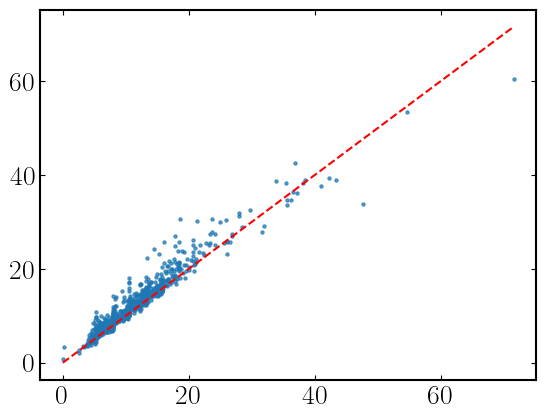

In [9]:
# plt.hist(metrics_df['radius_p50_pc'].dropna(), bins=40)
# plt.hist(metrics_df['radius_areaeq_pc'].dropna(), bins=40)
plt.scatter(metrics_df['radius_p50_pc'], metrics_df['radius_areaeq_pc'], alpha=0.7, s = 5)
#plot 1-1 line
plt.plot([0, metrics_df['radius_p50_pc'].max()], [0, metrics_df['radius_p50_pc'].max()], 'r--')

In [10]:
"""
Writes the final boundary label map to a FITS file.
"""
fits.PrimaryHDU(boundary_label.astype(np.float32)).writeto(boundary_fits, overwrite=True)
print(f"[done] Wrote boundary label map: {boundary_fits}")

[done] Wrote boundary label map: Boundary_maps/Boundary_map_100pc/Boundary_map_NE.fits


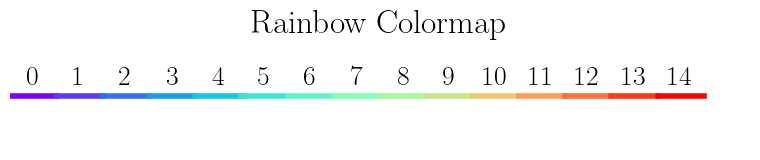

In [11]:
#make a list of 15 evenly spaced colours from the rainbow cmap to be used in all plots
cmap = plt.get_cmap('rainbow')
colors = [cmap(i) for i in np.linspace(0, 1, 15)]
#show the colours
plt.figure(figsize=(8, 2))
for i, color in enumerate(colors):
    plt.plot([i, i + 1], [0, 0], color=color, lw=4)
#label each colour with its index
for i in range(len(colors)):
    plt.text(i + 0.5, 0.1, str(i), ha='center', va='bottom')
plt.xlim(0, len(colors) + 1)
plt.ylim(-1, 1)
plt.axis('off')
plt.title('Rainbow Colormap')
plt.tight_layout()

In [12]:
def visualize_boundary_for_region(
    region_id,
    region_diagnostics,
    boundary_label,
    zoi_label,
    plots_dir="Boundary_map_plots",
    pixel_scale_pc=1.3,          # SITELLE on M33 ~ 1.3 pc/pixel
    radii_info=None,             # list like [(r_pc, r"$r_{50}$ = 18.5 pc"), ...]
    amplitude_units="",   
    ray_cmap="Purples",  
    for_paper=False  
):
    """
    Diagnostic plotting for one region: shows the cutout with rays and overlays
    ZOI and final boundary contours plus ray profiles.
    """
    import os
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.cm as cm

    # Try to use skimage for boundary outlines; if unavailable, skip contours
    try:
        from skimage.segmentation import find_boundaries
        have_skimage = True
    except Exception:
        have_skimage = False

    if radii_info is None:
        radii_info = []

    reg = region_diagnostics.get(region_id, None)
    if reg is None:
        raise ValueError(f"Region {region_id} not found in diagnostics.")

    sub = reg["sub"]
    cx_l, cy_l = reg["cx_l"], reg["cy_l"]
    x0, y0 = reg["x0"], reg["y0"]
    thetas = reg["thetas"]
    r_profiles = reg["r_profiles"]
    r_edges_raw = reg["r_edges_raw"]   # pixels
    region_label = int(reg.get("region_label", 0))
    bg = float(reg.get("bg", np.nan))

    # Log-scaled image for display
    finite = sub[np.isfinite(sub)]
    floor = np.nanpercentile(finite, 0.1) if finite.size else 1e-30
    log_sub = np.log10(np.maximum(sub, floor))

    # Fixed display range as requested
    vmin, vmax = -18, -15

    # Slice local masks
    zsub = (
        zoi_label[y0:y0 + sub.shape[0], x0:x0 + sub.shape[1]] == region_label
        if region_label > 0 else None
    )
    bsub = (
        boundary_label[y0:y0 + sub.shape[0], x0:x0 + sub.shape[1]] == region_label
        if region_label > 0 else None
    )

    if have_skimage and zsub is not None and np.any(zsub):
        z_edges = find_boundaries(zsub, mode="outer")
    else:
        z_edges = None

    if have_skimage and bsub is not None and np.any(bsub):
        b_edges = find_boundaries(bsub, mode="outer")
    else:
        b_edges = None

    fig, (ax_prof, ax_img) = plt.subplots(
        1, 2,
        figsize=(18, 6),
        gridspec_kw={"width_ratios": [1.5, 1]},
        constrained_layout=True,
    )

    # -------------------------
    # Left: image + rays
    # -------------------------
    ax_img.imshow(log_sub, origin="lower", cmap="rainbow", vmin=vmin, vmax=vmax)
    ax_img.scatter([cx_l], [cy_l], color="red", marker="+", s=60, zorder=5)

    # Greyscale colors for rays
    ray_cmap = cm.get_cmap(ray_cmap, len(thetas) + 2)

    # Ray length: extend to the farthest point in the ZoI
    if zsub is not None and np.any(zsub):
        yy, xx = np.where(zsub)
        rr_zoi = np.sqrt((xx - cx_l)**2 + (yy - cy_l)**2)
        rmax_ray_pix = np.nanmax(rr_zoi) if rr_zoi.size else 0.0
    else:
        rmax_ray_pix = np.nanmax(r_edges_raw[np.isfinite(r_edges_raw)]) if np.isfinite(r_edges_raw).any() else 0.0

    rmax_ray_pix = max(rmax_ray_pix, 1.0)

    for i, th in enumerate(thetas):
        color = ray_cmap(i + 1)  # avoid pure white / pure black extremes
        rr = np.linspace(0, rmax_ray_pix, 300)
        x_ray = cx_l + rr * np.cos(th)
        y_ray = cy_l + rr * np.sin(th)

        ax_img.plot(
            x_ray, y_ray,
            color=color,
            lw=0.8,
            alpha=0.5,
            zorder=3,
        )

        if np.isfinite(r_edges_raw[i]):
            ax_img.scatter(
                cx_l + r_edges_raw[i] * np.cos(th),
                cy_l + r_edges_raw[i] * np.sin(th),
                s=14,
                color=color,
                edgecolor="none",
                alpha=0.8,
                zorder=4,
            )

    # Contours
    if z_edges is not None:
        ax_img.contour(
            z_edges,
            levels=[0.5],
            colors="white",
            linewidths=1.2,
            origin="lower",
        )

    # if b_edges is not None:
    #     ax_img.contour(
    #         b_edges,
    #         levels=[0.5],
    #         colors="navy",
    #         linewidths=1.5,
    #         linestyles="--",
    #         origin="lower",
    #     )

    ax_img.set_aspect("equal")
    ax_img.set_xticks([])
    ax_img.set_yticks([])

    # Region ID text in top-left of left panel
    ax_img.text(
        0.03, 0.97,
        f"Region {region_id}",
        transform=ax_img.transAxes,
        ha="left",
        va="top",
        fontsize=15,
        bbox=dict(
            boxstyle="round,pad=0.3",
            facecolor="white",
            alpha=0.9,
            edgecolor="none",
        ),
        zorder=10,
    )

    # -------------------------
    # Right: radial profiles
    # -------------------------
    rmax_profile_pix = np.nanmax(r_edges_raw[np.isfinite(r_edges_raw)]) if np.isfinite(r_edges_raw).any() else 0.0
    rmax_profile_pix = max(rmax_profile_pix, 1.0)

    for i, th in enumerate(thetas):
        color = ray_cmap(i + 1)
        r_pix, prof_s = r_profiles[i]
        r_pc = np.asarray(r_pix) * pixel_scale_pc

        ax_prof.plot(
            r_pc,
            prof_s,
            color=color,
            lw=1.0,
            alpha=0.5,
        )

        if np.isfinite(r_edges_raw[i]):
            edge_pc = r_edges_raw[i] * pixel_scale_pc
            ax_prof.scatter(
                edge_pc,
                np.interp(r_edges_raw[i], r_pix, prof_s),
                color=color,
                s=15,
                alpha=0.8,
                zorder=3,
            )

    ax_prof.set_xlabel("Radius [pc]")

    if amplitude_units:
        ax_prof.set_ylabel(r"H$\alpha$ + [O III] amplitude" + f" [{amplitude_units}]")
    else:
        ax_prof.set_ylabel(r"H$\alpha$ + [O III] amplitude")

    ax_prof.grid(True, ls=":", alpha=0.3)
    ax_prof.set_xlim(0, max(10 * pixel_scale_pc, rmax_profile_pix * 1.05 * pixel_scale_pc))

    # Background line
    ax_prof.axhline(
        bg,
        ls="--",
        lw=1.0,
        alpha=0.6,
        color="gray",
    )
    
    # Tick styling
    ax_prof.minorticks_on()
    ax_prof.tick_params(
        axis='both', which='major',
        direction='in', length=7, width=1.5,
        labelsize=16, top=True, right=True
    )
    ax_prof.tick_params(
        axis='both', which='minor',
        direction='in', length=4, width=1.2,
        top=True, right=True
    )

    # Vertical radius markers + legend with rainbow colors
    legend_handles = []
    legend_labels = []

    if radii_info:
        
        color_list = [colors[0], colors[4], colors[8], colors[12]]
        for i, (rad_pc, label) in enumerate(radii_info):
            color = color_list[i]

            line = ax_prof.axvline(
                rad_pc,
                ls="--",
                lw=1.5,
                alpha=0.9,
                color=color,
            )

            legend_handles.append(line)
            legend_labels.append(label)

    if legend_handles:
        ax_prof.legend(
            legend_handles,
            legend_labels,
            loc="upper right",
            frameon=True,
            facecolor="white", edgecolor="black", framealpha=1.0
            
        )

    os.makedirs(plots_dir, exist_ok=True)
    if for_paper:
        outname = os.path.join('PAPER_PLOTS', f"Region_{region_id}_boundary_viz_{FIELD}.png")
    else:
        outname = os.path.join(plots_dir, f"Region_{region_id}_boundary_viz.png")
    plt.savefig(outname, dpi=150, bbox_inches="tight")
    plt.show()

    return outname

In [13]:
region_diagnostics.keys()

dict_keys(['NE_0001', 'NE_0002', 'NE_0003', 'NE_0004', 'NE_0005', 'NE_0006', 'NE_0007', 'NE_0008', 'NE_0009', 'NE_0010', 'NE_0011', 'NE_0012', 'NE_0013', 'NE_0014', 'NE_0015', 'NE_0016', 'NE_0017', 'NE_0018', 'NE_0019', 'NE_0020', 'NE_0021', 'NE_0022', 'NE_0023', 'NE_0024', 'NE_0025', 'NE_0026', 'NE_0027', 'NE_0028', 'NE_0029', 'NE_0030', 'NE_0031', 'NE_0032', 'NE_0033', 'NE_0034', 'NE_0035', 'NE_0036', 'NE_0037', 'NE_0038', 'NE_0039', 'NE_0040', 'NE_0041', 'NE_0042', 'NE_0043', 'NE_0044', 'NE_0045', 'NE_0046', 'NE_0047', 'NE_0048', 'NE_0049', 'NE_0050', 'NE_0051', 'NE_0052', 'NE_0053', 'NE_0054', 'NE_0055', 'NE_0056', 'NE_0057', 'NE_0058', 'NE_0059', 'NE_0060', 'NE_0061', 'NE_0062', 'NE_0063', 'NE_0064', 'NE_0065', 'NE_0066', 'NE_0067', 'NE_0068', 'NE_0069', 'NE_0070', 'NE_0071', 'NE_0072', 'NE_0073', 'NE_0074', 'NE_0075', 'NE_0076', 'NE_0077', 'NE_0078', 'NE_0079', 'NE_0080', 'NE_0081', 'NE_0082', 'NE_0083', 'NE_0084', 'NE_0085', 'NE_0086', 'NE_0087', 'NE_0088', 'NE_0089', 'NE_0090',

In [14]:
"""
Make a plot of one example region
"""
make_plots = True

if FIELD == 'NW':
    r_to_plot = ['NW_0824']


    r16 = metrics_df.set_index('region_id').loc[r_to_plot, 'radius_p16_pc']
    r50 = metrics_df.set_index('region_id').loc[r_to_plot, 'radius_p50_pc']
    r84 = metrics_df.set_index('region_id').loc[r_to_plot, 'radius_p84_pc']
    r_areaeq = metrics_df.set_index('region_id').loc[r_to_plot, 'radius_areaeq_pc']
    print(f"R16: {r16.values[0]:.2f} pc, R50: {r50.values[0]:.2f} pc, R84: {r84.values[0]:.2f} pc, R_areaeq: {r_areaeq.values[0]:.2f} pc")
    print(r16.iloc[0])
    if make_plots:
        saved = []
        for rid in r_to_plot:
            try:
                out = visualize_boundary_for_region(
                    rid,
                    region_diagnostics,
                    boundary_label=boundary_label,
                    zoi_label=zoi_label,
                    plots_dir=plots_dir,
                    pixel_scale_pc=1.3,
                    radii_info=[
                        (r16.iloc[0], f"$R_{{16}}$ = {r16.iloc[0]:.2f} pc"),
                        (r50.iloc[0], f"$R_{{50}}$ = {r50.iloc[0]:.2f} pc"),
                        (r84.iloc[0], f"$R_{{84}}$ = {r84.iloc[0]:.2f} pc"),
                        (r_areaeq.iloc[0], f"$R_{{c}}$ = {r_areaeq.iloc[0]:.2f} pc"),
                    ],  
                amplitude_units=" erg s$^{{-1}}$ cm$^{{-2}}$",
                ray_cmap="Greys",
                    for_paper=True,
                        )
                saved.append(out)
            except Exception as e:
                print(f"[warn] Plot failed for {rid}: {e}")

        print(f"[done] Saved {len(saved)} diagnostic plots to: {plots_dir}")

In [15]:

def make_contours_legacy(zoi_labels, filep='ContZoI_map'):
    """
    Matches your original: XOR with a 1-pixel erosion (square footprint),
    return NaN background with 1 on edges; also saves FITS.
    """
    h, w = zoi_labels.shape
    outfile = np.zeros((h, w), dtype=float)

    for ipeak in range(len(np.unique(zoi_labels))):
        L = float(ipeak + 1)
        cy, cx = np.where(zoi_labels == L)
        if cy.size == 0:
            continue

        y0, y1 = max(cy.min()-1, 0), min(cy.max()+2, h)
        x0, x1 = max(cx.min()-1, 0), min(cx.max()+2, w)

        reg = np.copy(zoi_labels[y0:y1, x0:x1])
        reg[reg != L] = 0.0
        mask = (reg == L)

        # edge by XOR with erosion (square 3x3, like your original)
        edge = np.logical_xor(mask, ndimage.binary_erosion(mask))
        cont = np.zeros_like(reg, dtype=float)
        cont[edge] = L + 1.0  # any nonzero marker

        # accumulate 
        outfile[y0:y1, x0:x1] = np.where(cont > 0, 1.0, outfile[y0:y1, x0:x1])

    outfile[outfile == 0] = np.nan

    cont_fits_path = f"{BOUND_DIR}/{filep}_{FIELD}.fits"
    if header_info is not None:
        fits.writeto(cont_fits_path, outfile, header_info, overwrite=True)
    else:
        fits.writeto(cont_fits_path, outfile, overwrite=True)
    print('   Saved boundary contours:', cont_fits_path)

    return outfile

cont_map = make_contours_legacy(boundary_label, filep='ContDomain_map')


   Saved boundary contours: Boundary_maps/Boundary_map_100pc/ContDomain_map_NE.fits


In [16]:
np.nanmax(boundary_label)

797.0

In [17]:
def plot_field_overlay_halpha_peaks_zoi_boundaries(
    catalog_df,
    ha_fits_path,
    zoi_label_map,
    boundary_label_map,
    field_name=None,
    x_col="x",
    y_col="y",
    region_label_col="zoi_center_label",
    region_id_col="region_id",
    xlim=None,
    ylim=None,
    show_peaks=True,
    show_zoi=True,
    show_boundaries=True,
    peaks_kwargs=None,
    zoi_color="cyan",
    boundary_color="magenta",
    zoi_lw=0.8,
    boundary_lw=1.1,
    alpha_zoi=0.65,
    alpha_boundary=0.9,
    # NEW: LogNorm controls
    ha_percentiles=(5, 99),         # global vmin/vmax percentiles (positive pixels only)
    use_local_lognorm=False,        # if True and xlim/ylim provided -> compute per-view norm
    local_percentiles=(3.0, 99.7),  # per-view percentiles (positive pixels only)
    min_pos_pixels=20,              # minimum positive pixels required to trust local percentiles
    eps_pos=None,                   # epsilon floor for vmin (defaults to nextafter(0,1))
    savepath=None,
):
    """
    Overplot peaks + ZOI outlines + boundary outlines on the Halpha map, using LogNorm scaling.

    Parameters
    ----------
    catalog_df : pandas.DataFrame
        Must include x_col/y_col; should include region_label_col (integer ZOI label at center).
    ha_fits_path : str
        Path to Halpha FITS.
    zoi_label_map : 2D array
        Integer-labeled ZOI map (0 outside).
    boundary_label_map : 2D array
        Integer-labeled boundary map (0 outside).
    field_name : str
        Optional display name.
    xlim, ylim : (min,max) or None
        Plot limits in pixel coordinates.
    ha_percentiles : (lo, hi)
        Percentiles used for global LogNorm vmin/vmax (positive finite pixels only).
    use_local_lognorm : bool
        If True and xlim/ylim are given, compute per-view LogNorm using local_percentiles,
        falling back to global if too few positive pixels.
    """

    import numpy as np
    import matplotlib.pyplot as plt
    from astropy.io import fits
    from matplotlib.colors import LogNorm

    # Lazy import so this cell works even if skimage isn't installed elsewhere
    try:
        from skimage.segmentation import find_boundaries  # noqa: F401  (kept as in your original)
    except Exception as e:
        raise ImportError(
            "This plotting function requires scikit-image. "
            "Install with: pip install scikit-image"
        ) from e

    if eps_pos is None:
        eps_pos = np.nextafter(0, 1)

    # --- Field name ---
    if field_name is None:
        field_name = (
            str(catalog_df.get("field", ["Field"]).iloc[0])
            if hasattr(catalog_df, "iloc")
            else "Field"
        )

    # --- Load Halpha map ---
    ha = fits.getdata(ha_fits_path)
    ha = np.where(np.isfinite(ha), ha, np.nan)

    # --- Compute GLOBAL LogNorm vmin/vmax from positive finite pixels ---
    valid_pos = ha[np.isfinite(ha) & (ha > 0)]
    if valid_pos.size == 0:
        raise ValueError("Hα map has no positive finite values for LogNorm.")

    vmin_global = np.nanpercentile(valid_pos, ha_percentiles[0])
    vmax_global = np.nanpercentile(valid_pos, ha_percentiles[1])

    # Fallback if percentiles are degenerate
    if (not np.isfinite(vmin_global)) or (not np.isfinite(vmax_global)) or (vmax_global <= vmin_global):
        vmin_global, vmax_global = np.nanmin(valid_pos), np.nanmax(valid_pos)
        if (not np.isfinite(vmin_global)) or (not np.isfinite(vmax_global)) or (vmax_global <= vmin_global):
            raise ValueError("Failed to compute valid global vmin/vmax for Hα.")

    vmin_global = max(vmin_global, eps_pos)

    def _local_lognorm(arr2d):
        """Compute a per-view LogNorm using positive finite pixels, fallback to global."""
        pos = arr2d[np.isfinite(arr2d) & (arr2d > 0)]
        vmin_loc, vmax_loc = vmin_global, vmax_global

        if pos.size >= min_pos_pixels:
            lo = np.nanpercentile(pos, local_percentiles[0])
            hi = np.nanpercentile(pos, local_percentiles[1])
            if np.isfinite(lo) and np.isfinite(hi) and hi > lo:
                vmin_loc, vmax_loc = lo, hi

        vmin_loc = max(vmin_loc, eps_pos)
        if (not np.isfinite(vmax_loc)) or (vmax_loc <= vmin_loc):
            vmax_loc = vmin_loc * 1.01
        return LogNorm(vmin=vmin_loc, vmax=vmax_loc)

    # Decide norm: global or local-per-view
    norm = LogNorm(vmin=vmin_global, vmax=vmax_global)
    if use_local_lognorm and (xlim is not None) and (ylim is not None):
        # Clip indices safely and compute norm on that view
        x0, x1 = sorted([int(np.floor(xlim[0])), int(np.ceil(xlim[1]))])
        y0, y1 = sorted([int(np.floor(ylim[0])), int(np.ceil(ylim[1]))])
        x0 = max(0, x0); y0 = max(0, y0)
        x1 = min(ha.shape[1], x1); y1 = min(ha.shape[0], y1)
        view = ha[y0:y1, x0:x1]
        if view.size > 0:
            norm = _local_lognorm(view)

    # --- Ensure integer maps ---
    zoi_int = np.rint(np.nan_to_num(zoi_label_map, nan=0)).astype(np.int32)
    bnd_int = np.rint(np.nan_to_num(boundary_label_map, nan=0)).astype(np.int32)

    # --- Figure ---
    fig, ax = plt.subplots(figsize=(10, 10 * ha.shape[0] / ha.shape[1]))

    # Make NaNs white
    cmap_gray = plt.get_cmap("gray").copy()
    cmap_gray.set_bad(color="white")

    # IMPORTANT CHANGE: show ha (linear) with LogNorm (not log10(ha))
    im = ax.imshow(ha, origin="lower", cmap=cmap_gray, norm=norm)

    # --- Overlay outlines ---
    labels_from_catalog = None
    if hasattr(catalog_df, "columns") and (region_label_col in catalog_df.columns):
        labels_from_catalog = sorted({
            int(v) for v in catalog_df[region_label_col].values
            if np.isfinite(v) and int(v) > 0
        })

    if labels_from_catalog and len(labels_from_catalog) > 0:
        labels = labels_from_catalog
    else:
        labels = sorted([int(v) for v in np.unique(bnd_int) if v > 0])

    # NOTE: your original code contours the entire label maps at 0.5, which is fine.
    if show_zoi and np.isfinite(zoi_int).any():
        edge = np.nan_to_num(zoi_int, nan=0.0)
        ax.contour(edge, levels=[0.5], colors=[zoi_color], linewidths=zoi_lw,
                   origin="lower", zorder=1, alpha=alpha_zoi)
    if show_boundaries and np.isfinite(bnd_int).any():
        edge = np.nan_to_num(bnd_int, nan=0.0)
        ax.contour(edge, levels=[0.5], colors=[boundary_color], linewidths=boundary_lw,
                   origin="lower", zorder=1, alpha=alpha_boundary)

    # --- Plot peak centers ---
    if show_peaks:
        if peaks_kwargs is None:
            peaks_kwargs = dict(marker="+", s=18, linewidths=0.8, alpha=0.85)
        xs = catalog_df[x_col].astype(float).values
        ys = catalog_df[y_col].astype(float).values
        ax.scatter(xs, ys, color="k", **peaks_kwargs, label="Peaks")

    # --- Colorbar ---
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(r"H$\alpha$ flux (LogNorm)")

    # --- Aesthetics ---
    ax.set_title(f"{field_name}: Halpha with Peaks, ZOI (cyan), Boundaries (magenta)")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_facecolor("white")
    fig.patch.set_facecolor("white")

    # Limits
    if xlim is not None:
        ax.set_xlim(*xlim)
    if ylim is not None:
        ax.set_ylim(*ylim)

    if show_peaks:
        ax.legend(loc="upper right", frameon=True)

    plt.tight_layout()

    if savepath:
        plt.savefig(savepath, bbox_inches="tight", dpi=300, facecolor="white")
        print(f"[done] Saved overlay plot: {savepath}")

    plt.show()
    return fig, ax

Creating overlay plot with peaks, ZOI, and boundaries; saving to: plots/boundary_plots//M33_NE_overlay_peaks_zoi_boundaries.png


[done] Saved overlay plot: plots/boundary_plots//M33_NE_overlay_peaks_zoi_boundaries.png


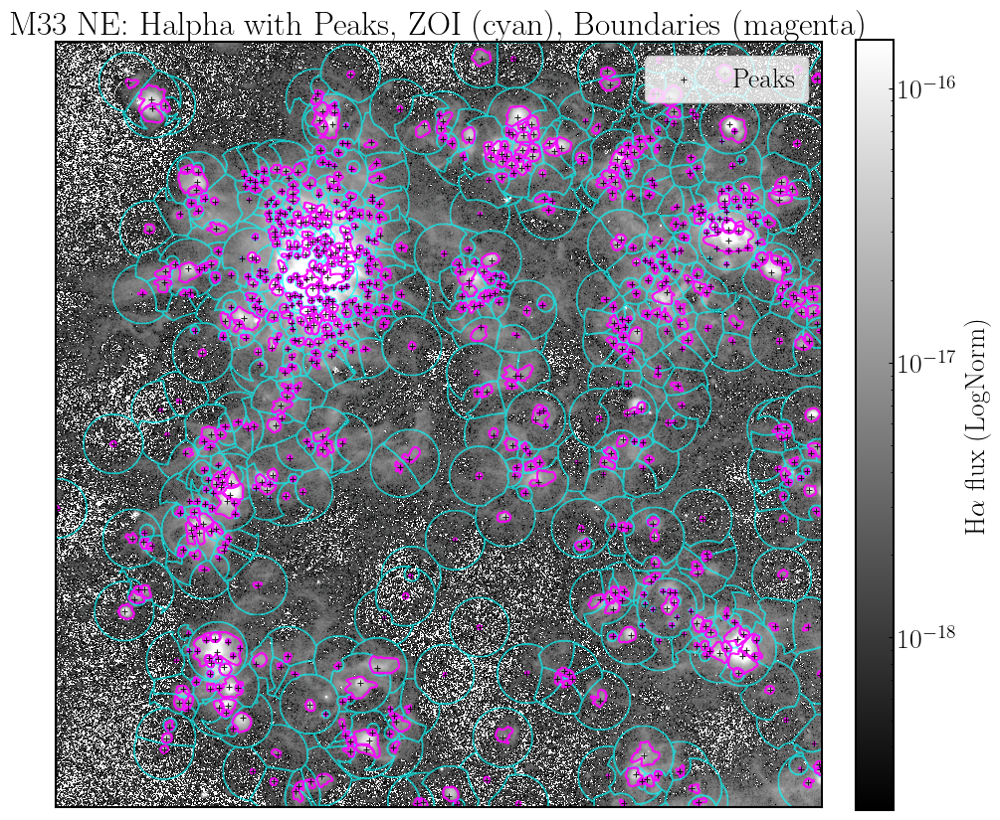

Creating overlay plot with peaks, ZOI, and boundaries; saving to: plots/boundary_plots//M33_NE_overlay_peaks_zoi.png


[done] Saved overlay plot: plots/boundary_plots//M33_NE_overlay_peaks_zoi.png


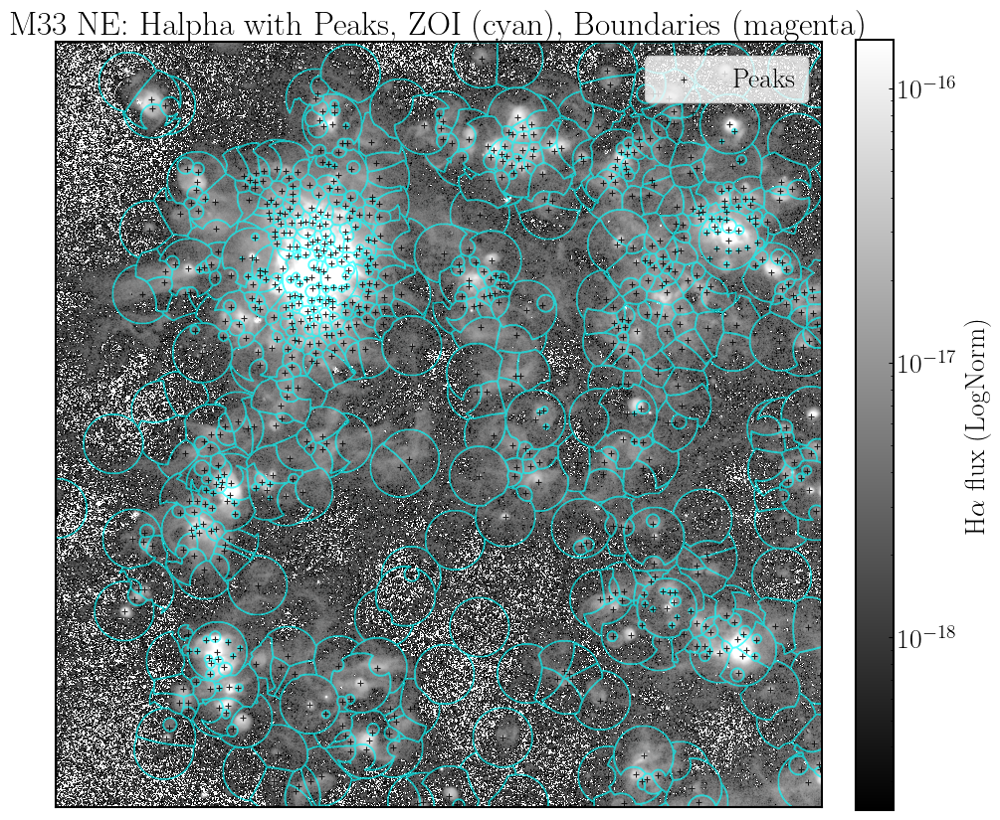

Creating overlay plot with peaks, ZOI, and boundaries; saving to: plots/boundary_plots//M33_NE_overlay_peaks_boundaries.png


[done] Saved overlay plot: plots/boundary_plots//M33_NE_overlay_peaks_boundaries.png


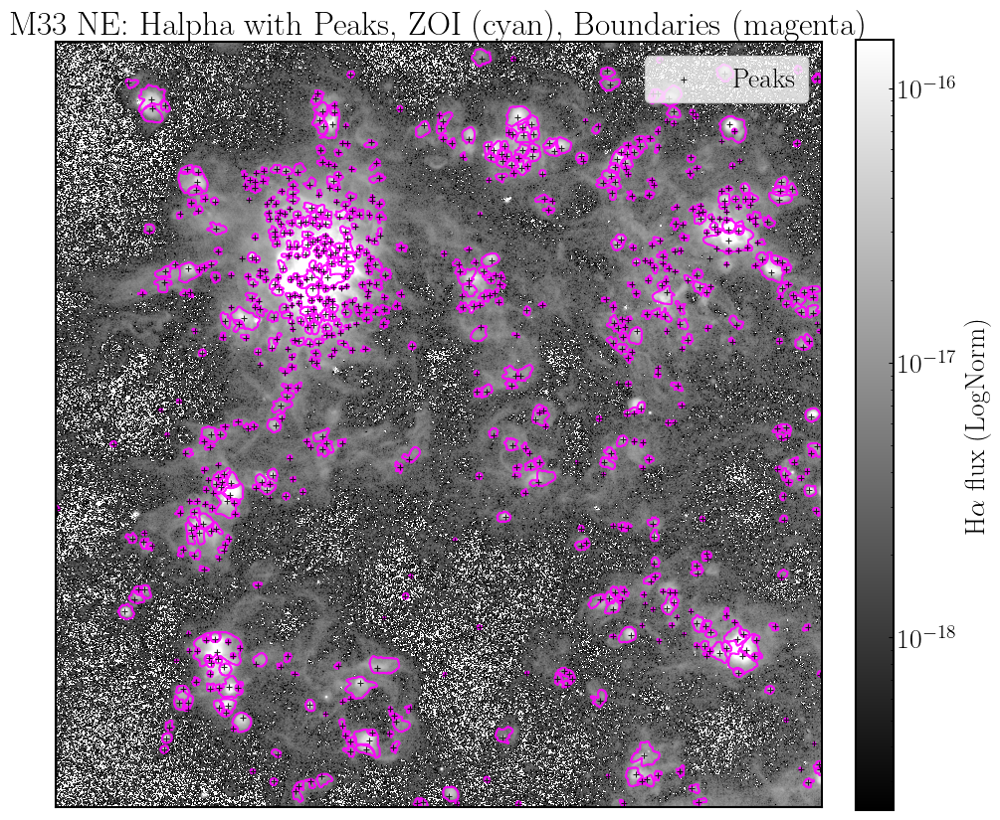

Creating overlay plot with peaks, ZOI, and boundaries; saving to: plots/boundary_plots//M33_NE_overlay_peaks.png


[done] Saved overlay plot: plots/boundary_plots//M33_NE_overlay_peaks.png


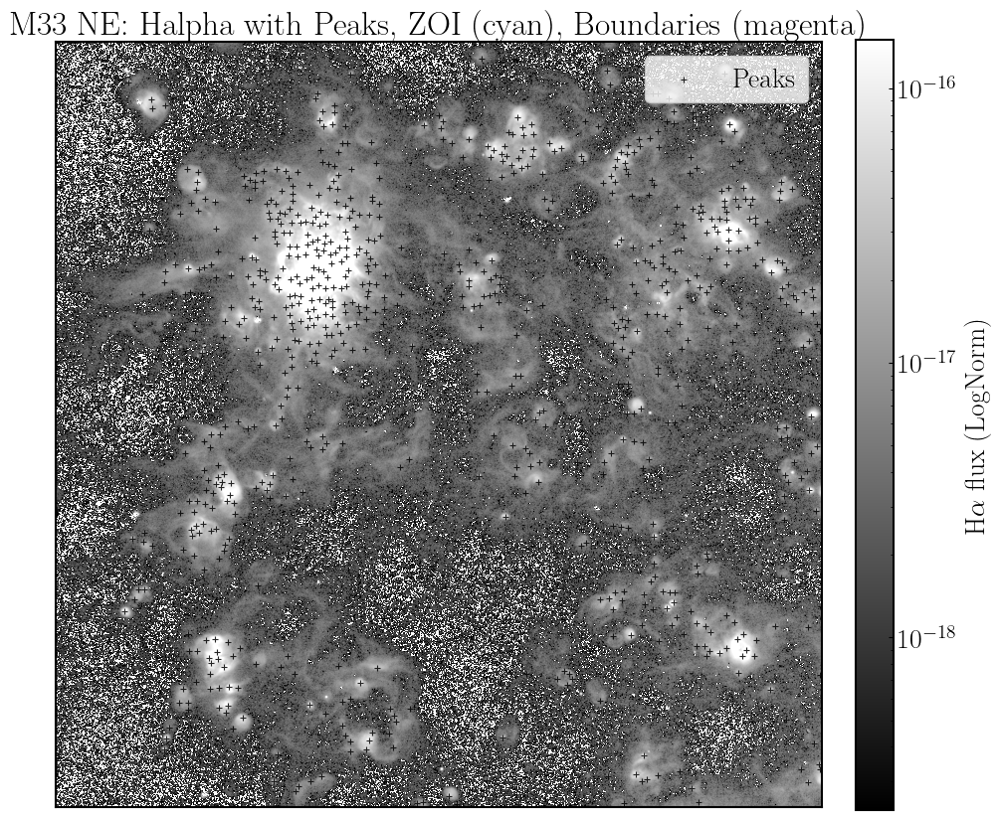

Creating overlay plot with peaks, ZOI, and boundaries; saving to: plots/boundary_plots//M33_NE_overlay__zoi_boundaries.png


[done] Saved overlay plot: plots/boundary_plots//M33_NE_overlay__zoi_boundaries.png


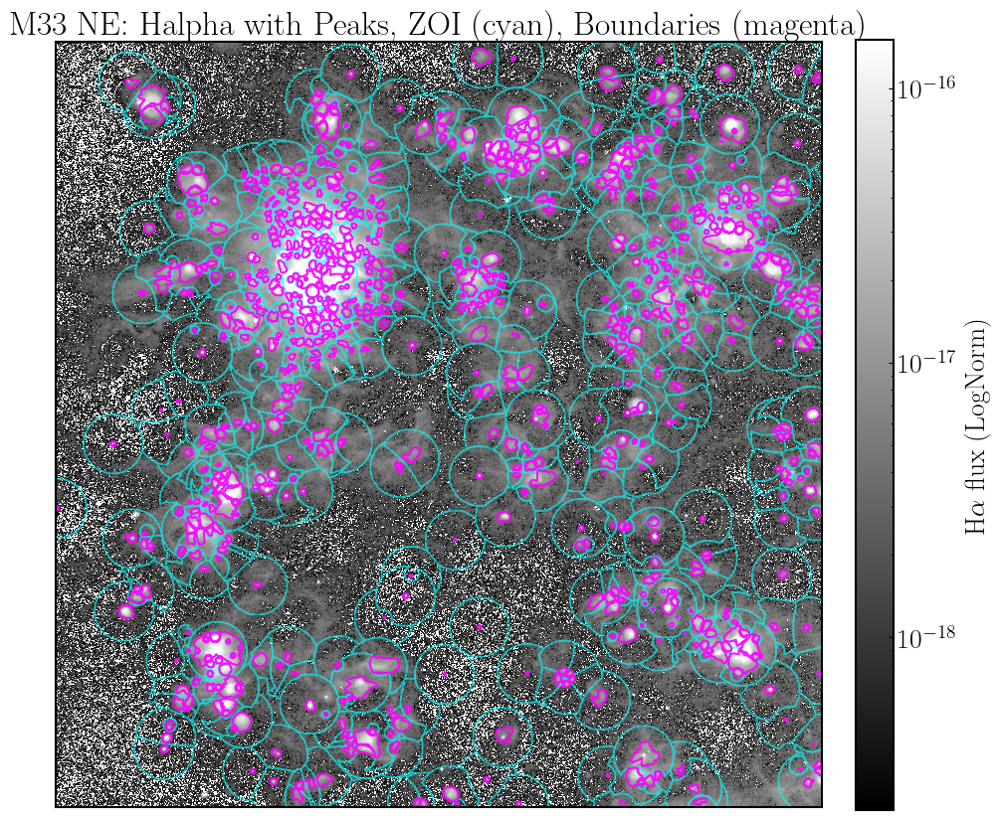

Creating overlay plot with peaks, ZOI, and boundaries; saving to: plots/boundary_plots//M33_NE_overlay__zoi.png


[done] Saved overlay plot: plots/boundary_plots//M33_NE_overlay__zoi.png


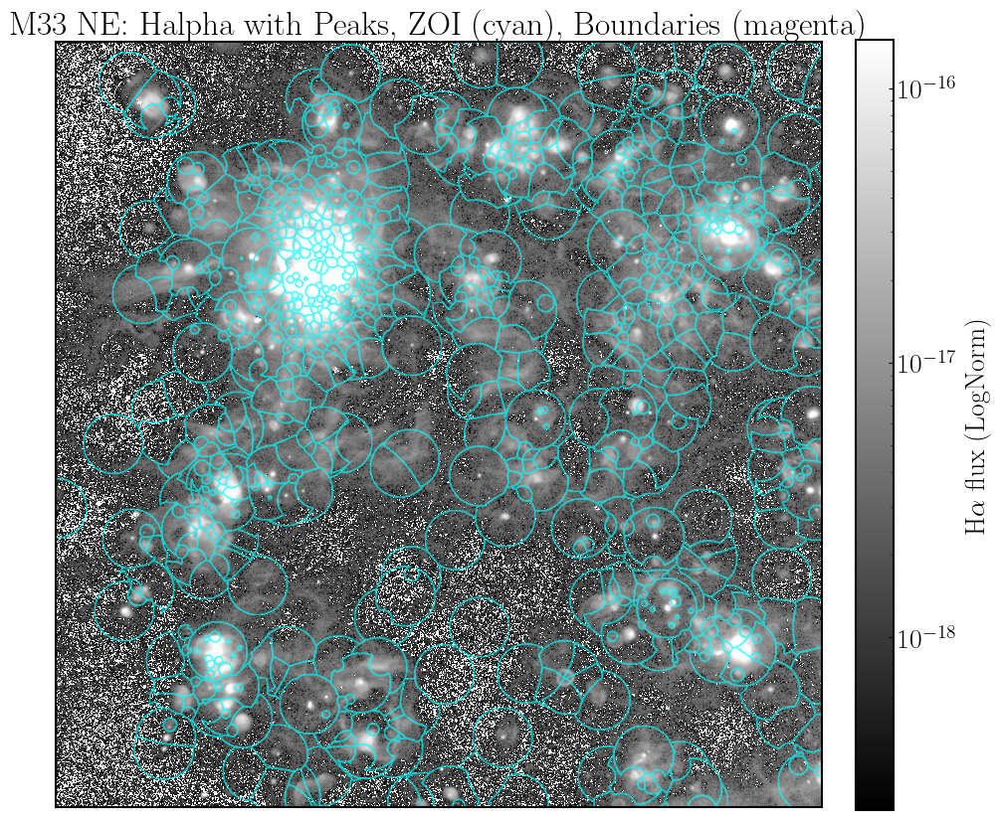

Creating overlay plot with peaks, ZOI, and boundaries; saving to: plots/boundary_plots//M33_NE_overlay__boundaries.png


[done] Saved overlay plot: plots/boundary_plots//M33_NE_overlay__boundaries.png


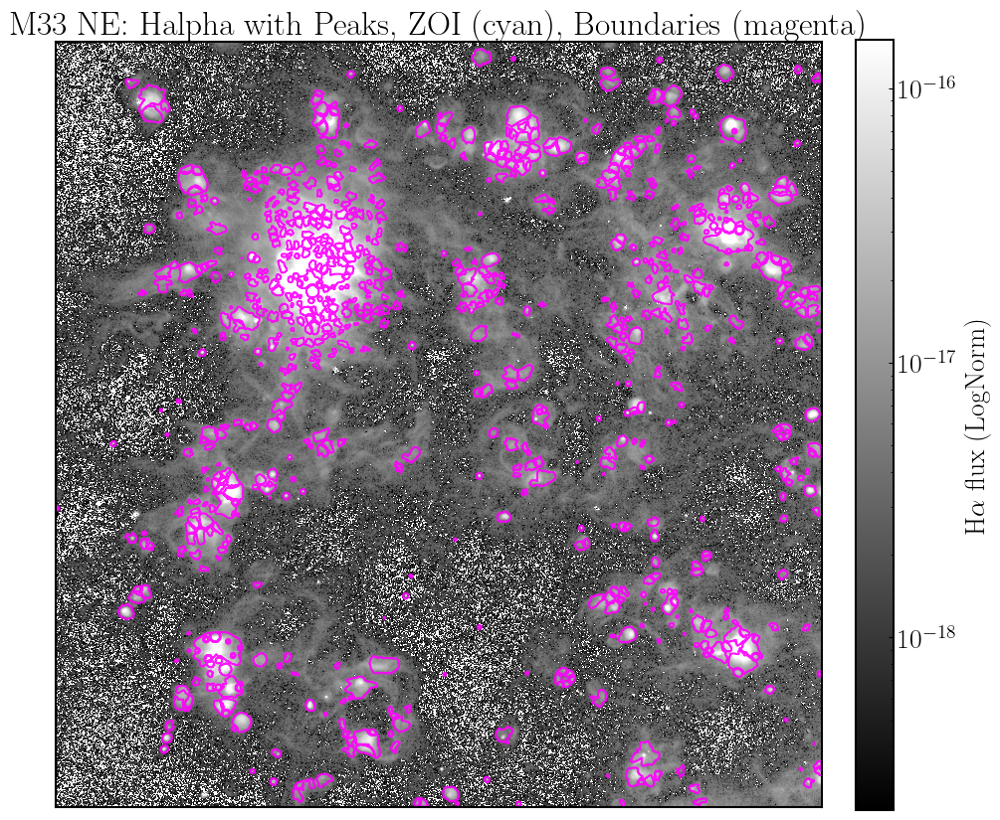

In [18]:
"""
Runs the full-field overlay plot using the variables created earlier in the notebook.
"""
# Example usage (matches your earlier variables):
# - combined: your peak catalog dataframe
# - halpha_fits: Halpha FITS path
# - zoi_label: ZOI label map (2D)
# - boundary_label: final boundary label map (2D)

# Optional: zoom limits (set to None to show full frame)
xlim = (50, 2000)
ylim = (50, 2000)

#plot all variations wih only peaks, zoi, boundaries and then all together
for show_peaks in [True, False]:
    for show_zoi in [True, False]:
        for show_boundaries in [True, False]:
            if not (show_peaks or show_zoi or show_boundaries):
                continue  # skip empty plot
            plot_overlay_path = f"{plots_dir}/M33_{FIELD}_overlay_{'peaks' if show_peaks else ''}{'_zoi' if show_zoi else ''}{'_boundaries' if show_boundaries else ''}.png"
            print(f"Creating overlay plot with peaks, ZOI, and boundaries; saving to: {plot_overlay_path}")
            plot_field_overlay_halpha_peaks_zoi_boundaries(
                catalog_df=combined,
                ha_fits_path=halpha_fits,
                zoi_label_map=contzoi_label,
                boundary_label_map=cont_map,
                field_name=f"M33 {FIELD}",
                x_col="x",
                y_col="y",
                region_label_col="zoi_center_label",
                xlim=xlim,
                ylim=ylim,
                show_peaks=show_peaks,
                show_zoi=show_zoi,
                show_boundaries=show_boundaries,
                savepath=plot_overlay_path,
            )

In [19]:
# #mean, median and std of the radius metrics in the metrics_df table
# for col in ['radius_p16_pc', 'radius_p50_pc', 'radius_p84_pc', 'radius_areaeq_pc']:
#     mean_val = metrics_df[col].mean()
#     median_val = metrics_df[col].median()
#     std_val = metrics_df[col].std()
#     print(f"{col}: mean={mean_val:.2f} pc, median={median_val:.2f} pc, std={std_val:.2f} pc")